# Advanced Regression Assignment

## Problem Statement

A US-based housing company named Surprise Housing has decided to enter the Australian market. The company uses data analytics to purchase houses at a price below their actual values and flip them on at a higher price. For the same purpose, the company has collected a data set from the sale of houses in Australia. The data is provided in the CSV file below.


The company is looking at prospective properties to buy to enter the market. You are required to build a regression model using regularisation in order to predict the actual value of the prospective properties and decide whether to invest in them or not.


The company wants to know:

Which variables are significant in predicting the price of a house, and

How well those variables describe the price of a house.

Also, determine the optimal value of lambda for ridge and lasso regression.

### Business Goal 

You are required to model the price of houses with the available independent variables. This model will then be used by the management to understand how exactly the prices vary with the variables. They can accordingly manipulate the strategy of the firm and concentrate on areas that will yield high returns. Further, the model will be a good way for management to understand the pricing dynamics of a new market.

In [214]:
# import libraries needed for this code
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

import warnings
warnings.filterwarnings('ignore')

# Part 1: Data understanding, Data cleaning, EDA and Data Preperation

## Step 1: Reading and Understanding the Data

In [215]:
# read the data
housing = pd.read_csv("train.csv")

In [216]:
# Check the head of the dataset
housing.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000


In [217]:
# Check all columns
housing.columns

Index(['Id', 'MSSubClass', 'MSZoning', 'LotFrontage', 'LotArea', 'Street',
       'Alley', 'LotShape', 'LandContour', 'Utilities', 'LotConfig',
       'LandSlope', 'Neighborhood', 'Condition1', 'Condition2', 'BldgType',
       'HouseStyle', 'OverallQual', 'OverallCond', 'YearBuilt', 'YearRemodAdd',
       'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType',
       'MasVnrArea', 'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual',
       'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinSF1',
       'BsmtFinType2', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', 'Heating',
       'HeatingQC', 'CentralAir', 'Electrical', '1stFlrSF', '2ndFlrSF',
       'LowQualFinSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath',
       'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'KitchenQual',
       'TotRmsAbvGrd', 'Functional', 'Fireplaces', 'FireplaceQu', 'GarageType',
       'GarageYrBlt', 'GarageFinish', 'GarageCars', 'GarageArea', 'GarageQual',
       'GarageCond', 'PavedDrive

Inspect the various aspects of the 'train' dataframe.

At first look, we can say some of the important columns in the dataset are Neighborhood', 'Condition1', 'Condition2', 'BldgType', 'HouseStyle', 'OverallQual', 'OverallCond', 'YearBuilt', 'Foundation', 'HeatingQC', 'YrSold' etc.

The **target variable**, which we want to compare across the independent variables, is **SalePrice**. 
The goal is to figure out:
1. Which independent variables are significant in predicting the SalePrice
2. How well those variables describe the SalePrice


In [218]:
housing.shape

(1460, 81)

In [219]:
housing.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 81 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             1460 non-null   int64  
 1   MSSubClass     1460 non-null   int64  
 2   MSZoning       1460 non-null   object 
 3   LotFrontage    1201 non-null   float64
 4   LotArea        1460 non-null   int64  
 5   Street         1460 non-null   object 
 6   Alley          91 non-null     object 
 7   LotShape       1460 non-null   object 
 8   LandContour    1460 non-null   object 
 9   Utilities      1460 non-null   object 
 10  LotConfig      1460 non-null   object 
 11  LandSlope      1460 non-null   object 
 12  Neighborhood   1460 non-null   object 
 13  Condition1     1460 non-null   object 
 14  Condition2     1460 non-null   object 
 15  BldgType       1460 non-null   object 
 16  HouseStyle     1460 non-null   object 
 17  OverallQual    1460 non-null   int64  
 18  OverallC

There are 3 + 35 = 38 numerical features in the dataset &
There are 43 categorical features in the dataset

In [220]:
housing.describe([0.25,0.50,0.75,0.99])

,Id,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,...,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
count,1460.000000,1460.000000,1201.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1452.000000,1460.000000,...,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000
mean,730.500000,56.897260,70.049958,10516.828082,6.099315,5.575342,1971.267808,1984.865753,103.685262,443.639726,...,94.244521,46.660274,21.954110,3.409589,15.060959,2.758904,43.489041,6.321918,2007.815753,180921.195890
std,421.610009,42.300571,24.284752,9981.264932,1.382997,1.112799,30.202904,20.645407,181.066207,456.098091,...,125.338794,66.256028,61.119149,29.317331,55.757415,40.177307,496.123024,2.703626,1.328095,79442.502883
min,1.000000,20.000000,21.000000,1300.000000,1.000000,1.000000,1872.000000,1950.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,2006.000000,34900.000000
25%,365.750000,20.000000,59.000000,7553.500000,5.000000,5.000000,1954.000000,1967.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,5.000000,2007.000000,129975.000000
50%,730.500000,50.000000,69.000000,9478.500000,6.000000,5.000000,1973.000000,1994.000000,0.000000,383.500000,...,0.000000,25.000000,0.000000,0.000000,0.000000,0.000000,0.000000,6.000000,2008.000000,163000.000000
75%,1095.250000,70.000000,80.000000,11601.500000,7.000000,6.000000,2000.000000,2004.000000,166.000000,712.250000,...,168.000000,68.000000,0.000000,0.000000,0.000000,0.000000,0.000000,8.000000,2009.000000,214000.000000
99%,1445.410000,190.000000,141.000000,37567.640000,10.000000,9.000000,2009.000000,2009.000000,791.920000,1572.410000,...,505.460000,285.820000,261.050000,168.000000,268.050000,0.000000,700.000000,12.000000,2010.000000,442567.010000
max,1460.000000,190.000000,313.000000,215245.000000,10.000000,9.000000,2010.000000,2010.000000,1600.000000,5644.000000,...,857.000000,547.000000,552.000000,508.000000,480.000000,738.000000,15500.000000,12.000000,2010.000000,755000.000000


## Step 2: Data Cleaning

In [221]:
# making cop of original data, all cleaning will be done on the copy (deep cop), so that we have the original data for reference in case needed
housing_clean = housing.copy()

### Null values in columns

In [222]:
# Checking the dataset for the nulls present 
round(housing_clean.isnull().sum()).sort_values(ascending=False).head(20)

PoolQC          1453
MiscFeature     1406
Alley           1369
Fence           1179
FireplaceQu      690
LotFrontage      259
GarageYrBlt       81
GarageCond        81
GarageType        81
GarageFinish      81
GarageQual        81
BsmtFinType2      38
BsmtExposure      38
BsmtQual          37
BsmtCond          37
BsmtFinType1      37
MasVnrArea         8
MasVnrType         8
Electrical         1
Id                 0
dtype: int64

In [223]:
# Checking the dataset for the % of nulls present 
round(housing_clean.isnull().sum()/len(housing_clean.index)*100,2).sort_values(ascending=False).head(20)

PoolQC          99.52
MiscFeature     96.30
Alley           93.77
Fence           80.75
FireplaceQu     47.26
LotFrontage     17.74
GarageYrBlt      5.55
GarageCond       5.55
GarageType       5.55
GarageFinish     5.55
GarageQual       5.55
BsmtFinType2     2.60
BsmtExposure     2.60
BsmtQual         2.53
BsmtCond         2.53
BsmtFinType1     2.53
MasVnrArea       0.55
MasVnrType       0.55
Electrical       0.07
Id               0.00
dtype: float64

### Considering 80% as my threshold and dropping the columns having null values more then the threshold


In [224]:
# columns that as null values > threshold
round(housing_clean.isnull().sum()/len(housing_clean.index)*100,2)[round(housing_clean.isnull().sum()/len(housing_clean.index)*100,2).values>80]

Alley          93.77
PoolQC         99.52
Fence          80.75
MiscFeature    96.30
dtype: float64

So there are 4 columns to be dropped: Alley, PoolQC, Fence and MiscFeature

In [225]:
# removing columns with null values > 80%
housing_clean = housing_clean.drop(['Alley','PoolQC','Fence','MiscFeature'],axis='columns')
housing_clean.head(5)

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,Utilities,LotConfig,...,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,Reg,Lvl,AllPub,Inside,...,0,0,0,0,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,Reg,Lvl,AllPub,FR2,...,0,0,0,0,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,IR1,Lvl,AllPub,Inside,...,0,0,0,0,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,IR1,Lvl,AllPub,Corner,...,272,0,0,0,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,IR1,Lvl,AllPub,FR2,...,0,0,0,0,0,12,2008,WD,Normal,250000


### Unique values in columns
Check number of Unique values in each column. Column/s with just one unique value has no information to offer and hence can be dropped.

In [226]:
housing_clean.nunique().sort_values(ascending=True).head(10) # checking unique values

Street          2
Utilities       2
CentralAir      2
PavedDrive      3
HalfBath        3
LandSlope       3
BsmtHalfBath    3
GarageFinish    3
Fireplaces      4
FullBath        4
dtype: int64

There are no columns with just one unique value (same value through out), so no action needed.

### REMOVE CATEGORICAL COLUMN/s WITH HIGH BIASED INFORMATION

#### Identify categorical column/s having more than 90% values associated to one specific category and hence giving highly skewed , biased information for training. Using such features for training will make algorithm learn patterns which are biased towards one specific category.

In [227]:
# Method to get the column names that have count of one category more than 90%

rows, cols = housing_clean.shape
print('total number of rows are = ', rows)
threshold = round(rows * 90 /100)   # 90% of rows having same values
print('num of treshold rows = ', int(threshold))

def getCategoricalValueCounts():
    column_count = []
    categorical_columns = housing_clean.select_dtypes(include=['object'])
    for col in (categorical_columns):
        if(housing_clean[col].value_counts().max() >= threshold):
            column_count.append([col, housing_clean[col].value_counts().max()])
    return column_count 

columns_to_drop = getCategoricalValueCounts()
print(columns_to_drop)

total number of rows are =  1460
num of treshold rows =  1314
[['Street', 1454], ['Utilities', 1459], ['LandSlope', 1382], ['Condition2', 1445], ['RoofMatl', 1434], ['Heating', 1428], ['CentralAir', 1365], ['Electrical', 1334], ['Functional', 1360], ['GarageCond', 1326], ['PavedDrive', 1340]]


In [228]:
''' 
# plot 'Sale Price' with respect to 'Heating'

plt.figure(figsize=(20, 8))
sns.barplot(x="Heating", y="SalePrice", data= housing_clean)
plt.title("Sales Price with respect to Heating")
plt.xticks(rotation=90)
''' 

' \n# plot \'Sale Price\' with respect to \'Heating\'\n\nplt.figure(figsize=(20, 8))\nsns.barplot(x="Heating", y="SalePrice", data= housing_clean)\nplt.title("Sales Price with respect to Heating")\nplt.xticks(rotation=90)\n'

In [229]:
# let us drop the categorical columns with biased data
for i in columns_to_drop:
    housing_clean.drop(i[0], axis = 1, inplace = True)
    
print(housing_clean.shape)
housing_clean.head()

(1460, 66)


,Id,MSSubClass,MSZoning,LotFrontage,LotArea,LotShape,LandContour,LotConfig,Neighborhood,Condition1,...,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Reg,Lvl,Inside,CollgCr,Norm,...,0,0,0,0,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Reg,Lvl,FR2,Veenker,Feedr,...,0,0,0,0,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,IR1,Lvl,Inside,CollgCr,Norm,...,0,0,0,0,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,IR1,Lvl,Corner,Crawfor,Norm,...,272,0,0,0,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,IR1,Lvl,FR2,NoRidge,Norm,...,0,0,0,0,0,12,2008,WD,Normal,250000


In [230]:
rows, cols = housing_clean.shape  
print('rows = {}, columns = {}'.format(rows, cols))

rows = 1460, columns = 66


Size reduced from (1460, 81) to (1460, 66)

### REMOVE NUMERICAL COLUMN/S WITH HIGH BIASED INFORMATION

#### Identify numerical column/s having more than 90% values associated to one specific value and hence giving highly skewed , biased information for training. 
#### Using such features for training will make algorithm learn patterns which are biased towards one specific category.
#### We will remove any column that has one value repeating more than 90% times as this column would be skewed to one value


In [231]:
# Method to get the column names that have count of one value more than 90%

rows, cols = housing_clean.shape
print('total number of rows are = ', rows)
threshold = rows * 90 /100   # 90% of rows having same values
print('num of treshold rows = ', int(threshold))

def getNumericalValueCounts():
    column_count = []
    Numerical_columns = housing_clean.select_dtypes(include = ['int64', 'float'])
    for col in (Numerical_columns):
        if(housing_clean[col].value_counts().max() >= threshold):
            column_count.append([col, housing_clean[col].value_counts().max()])
    return column_count 

columns_to_drop = getNumericalValueCounts()
print(columns_to_drop)

total number of rows are =  1460
num of treshold rows =  1314
[['LowQualFinSF', 1434], ['BsmtHalfBath', 1378], ['KitchenAbvGr', 1392], ['3SsnPorch', 1436], ['ScreenPorch', 1344], ['PoolArea', 1453], ['MiscVal', 1408]]


In [232]:
# let us drop the numerical columns with biased data
for i in columns_to_drop:
    housing_clean.drop(i[0], axis = 1, inplace = True)
    
print(housing_clean.shape)
housing_clean.head()

(1460, 59)


,Id,MSSubClass,MSZoning,LotFrontage,LotArea,LotShape,LandContour,LotConfig,Neighborhood,Condition1,...,GarageArea,GarageQual,WoodDeckSF,OpenPorchSF,EnclosedPorch,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Reg,Lvl,Inside,CollgCr,Norm,...,548,TA,0,61,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Reg,Lvl,FR2,Veenker,Feedr,...,460,TA,298,0,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,IR1,Lvl,Inside,CollgCr,Norm,...,608,TA,0,42,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,IR1,Lvl,Corner,Crawfor,Norm,...,642,TA,0,35,272,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,IR1,Lvl,FR2,NoRidge,Norm,...,836,TA,192,84,0,12,2008,WD,Normal,250000


### Missing values in rows
Rows with large number of missing values should be dropped as the are not having adequate amount of information

In [233]:
# missing values per row
round(housing_clean.isnull().sum(axis=1)).sort_values(ascending=False).head(20)

1011    10
39      10
1218    10
705     10
533     10
520     10
1179     9
392      7
342      7
1035     7
1321     7
102      6
646      6
1143     6
259      6
553      6
1090     6
1407     6
287      6
1412     6
dtype: int64

Out of 59 columns maximum 10 columns values are null (for 6 rows), so approximately 17% data missing for those 6 rows.
### no rows have major data missing and hence no need to drop any rows

### NO RELEVANT INFORMATION
#### Let us drop columns that has no information which is related to sales price.
Only one such column identified: 'ID'

In [234]:
housing_clean.drop('Id', axis=1, inplace=True)

### Duplicate checking

In [235]:
housing_dup = housing_clean.copy() # Created a copy of original dataframe for duplicate check

housing_dup.drop_duplicates(subset=None, inplace=True) # Checking for duplicates and dropping the entire duplicate row if any

housing_dup.shape

(1460, 58)

OSERVATIONS: The shape after running the drop duplicate command is same as the original dataframe.

Which means there are zero duplicates in the dataset.

NO ACTION NEEDED

In [236]:
housing_clean.dtypes  # checking data types of features retained 

MSSubClass         int64
MSZoning          object
LotFrontage      float64
LotArea            int64
LotShape          object
LandContour       object
LotConfig         object
Neighborhood      object
Condition1        object
BldgType          object
HouseStyle        object
OverallQual        int64
OverallCond        int64
YearBuilt          int64
YearRemodAdd       int64
RoofStyle         object
Exterior1st       object
Exterior2nd       object
MasVnrType        object
MasVnrArea       float64
ExterQual         object
ExterCond         object
Foundation        object
BsmtQual          object
BsmtCond          object
BsmtExposure      object
BsmtFinType1      object
BsmtFinSF1         int64
BsmtFinType2      object
BsmtFinSF2         int64
BsmtUnfSF          int64
TotalBsmtSF        int64
HeatingQC         object
1stFlrSF           int64
2ndFlrSF           int64
GrLivArea          int64
BsmtFullBath       int64
FullBath           int64
HalfBath           int64
BedroomAbvGr       int64


## STEP 3: Data Visualization & EDA 
Let's now spend some time doing the most important step - understanding the data through visualization and getting some insights which is not evident from statistics 

In [237]:
# let us identify and segregate numerical features and categorical features
numerical_features = []
categorical_features = []
for i in housing_clean.columns:
    if housing_clean[i].dtypes != 'O':
        numerical_features.append(i)
    else:
        categorical_features.append(i)
print('There are', len(numerical_features) ,'numerical features in the dataset, namely \n', numerical_features)
print('\n\nThere are', len(categorical_features), 'categorical features in the dataset, namely \n', categorical_features)


There are 30 numerical features in the dataset, namely 
 ['MSSubClass', 'LotFrontage', 'LotArea', 'OverallQual', 'OverallCond', 'YearBuilt', 'YearRemodAdd', 'MasVnrArea', 'BsmtFinSF1', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', '1stFlrSF', '2ndFlrSF', 'GrLivArea', 'BsmtFullBath', 'FullBath', 'HalfBath', 'BedroomAbvGr', 'TotRmsAbvGrd', 'Fireplaces', 'GarageYrBlt', 'GarageCars', 'GarageArea', 'WoodDeckSF', 'OpenPorchSF', 'EnclosedPorch', 'MoSold', 'YrSold', 'SalePrice']


There are 28 categorical features in the dataset, namely 
 ['MSZoning', 'LotShape', 'LandContour', 'LotConfig', 'Neighborhood', 'Condition1', 'BldgType', 'HouseStyle', 'RoofStyle', 'Exterior1st', 'Exterior2nd', 'MasVnrType', 'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2', 'HeatingQC', 'KitchenQual', 'FireplaceQu', 'GarageType', 'GarageFinish', 'GarageQual', 'SaleType', 'SaleCondition']


Text(0.5, 1.0, 'House Sale Price vs Year-Sold')

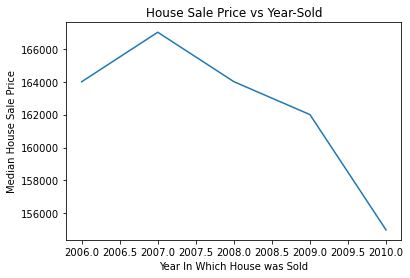

In [238]:
# Chekcing if year sold has any effect on House sales price 
# housing_clean['YrSold'] = housing_clean['YrSold'].astype('int')
housing_clean.groupby('YrSold')['SalePrice'].median().plot()
plt.xlabel('Year In Which House was Sold')
plt.ylabel('Median House Sale Price')
plt.title("House Sale Price vs Year-Sold")


The graph indicates that price was at peak in 2007 and then it started decreasing and after the 2008 house price bubble bursted, the house prices dropped significantly. This means the year in which the house was sold has a considerable effect on the sale price. (Was planning to create new variable for 'age of house' using year-sold and then drop column for Year-sold, but seeing this graph, decided to keep year-sold)

### Look for multicollinearity & high correlation between features
If there is some obvious multicollinearity going on, this is the first place to catch it
Here's where we'll also identify if some predictors directly have a strong association with the outcome variable
We'll visualise our data using matplotlib and seaborn.

#### Visualising Numeric Variables

In [239]:
#Visualising numerical predictor variables v/s Target Variables

print(housing_clean.dtypes)

print(len(numerical_features), numerical_features)
num_data = housing_clean.select_dtypes(include=['int64','float64'])
print(num_data.shape)
print(num_data.columns)

MSSubClass         int64
MSZoning          object
LotFrontage      float64
LotArea            int64
LotShape          object
LandContour       object
LotConfig         object
Neighborhood      object
Condition1        object
BldgType          object
HouseStyle        object
OverallQual        int64
OverallCond        int64
YearBuilt          int64
YearRemodAdd       int64
RoofStyle         object
Exterior1st       object
Exterior2nd       object
MasVnrType        object
MasVnrArea       float64
ExterQual         object
ExterCond         object
Foundation        object
BsmtQual          object
BsmtCond          object
BsmtExposure      object
BsmtFinType1      object
BsmtFinSF1         int64
BsmtFinType2      object
BsmtFinSF2         int64
BsmtUnfSF          int64
TotalBsmtSF        int64
HeatingQC         object
1stFlrSF           int64
2ndFlrSF           int64
GrLivArea          int64
BsmtFullBath       int64
FullBath           int64
HalfBath           int64
BedroomAbvGr       int64


#### Plotting heatmap to check the corellation between numerical features

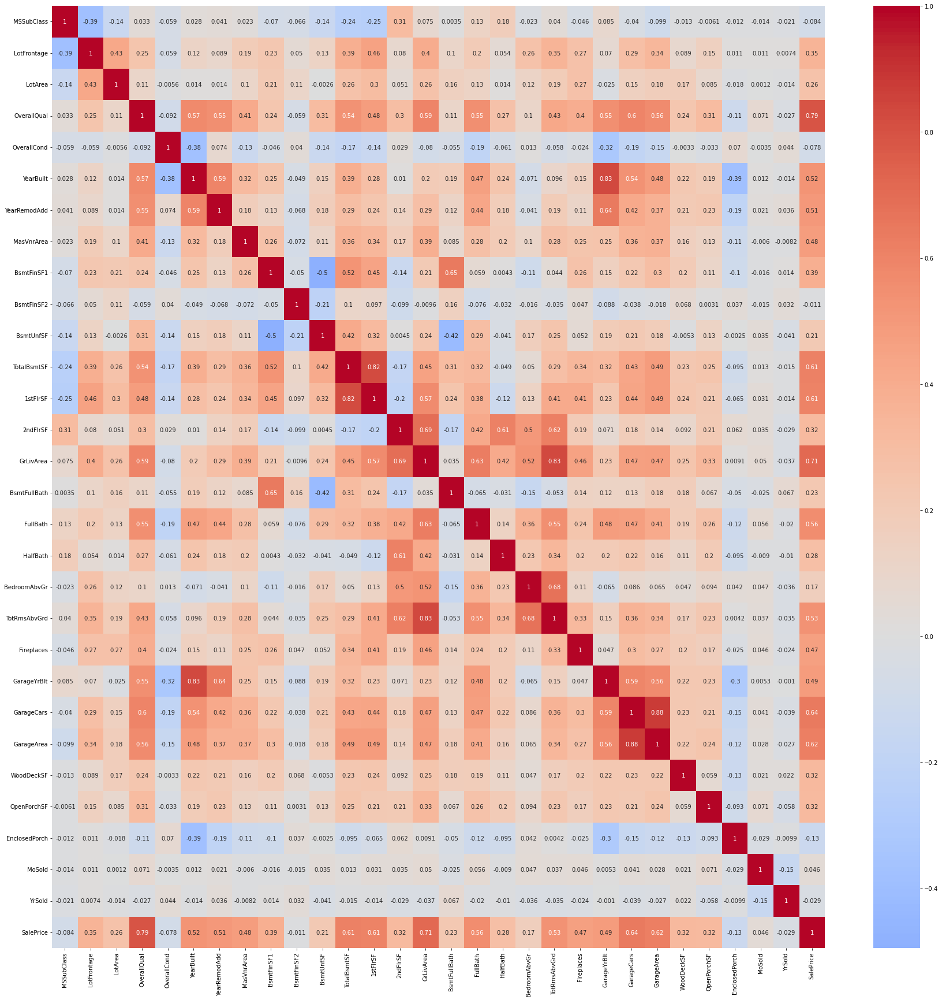

In [240]:
plt.figure(figsize=(30,30))
sns.heatmap(housing_clean[list(housing_clean.dtypes[housing_clean.dtypes!='object'].index)].corr(),cmap='coolwarm', annot=True, center = 0)
plt.show()


#### We can see that a lot of features are highly correlated with correlation values as high as 0.88, 0.83 etc. 

#### While we will do more analysis of some of the identified multicollinear attributes before removing them, a few are obviously and logically strongly related and hence redundant feature/s can be droped at this stage too.

### So removing following columns:
    -GarageYrBlt with 0.83 correlation with YearBuilt as most garages are build when house is built
    -GrLivArea (Above ground living area square feet) that has 0.83 correlation with TotRmsAbvGrd (Total rooms above ground)
    -GarageCars (Size of garage in car capacity) that has 0.88 correlation with GarageArea (Size of garage in square feet)

#### Before dropping other multicollinear columns, we will check their predictive power

In [241]:
# now we can drop 'GarageYrBlt', 'GrLivArea' and 'GarageCars'
housing_clean.drop(['GarageYrBlt', 'GrLivArea', 'GarageCars'], axis='columns', inplace=True)

In [242]:
housing_clean.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 55 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   MSSubClass     1460 non-null   int64  
 1   MSZoning       1460 non-null   object 
 2   LotFrontage    1201 non-null   float64
 3   LotArea        1460 non-null   int64  
 4   LotShape       1460 non-null   object 
 5   LandContour    1460 non-null   object 
 6   LotConfig      1460 non-null   object 
 7   Neighborhood   1460 non-null   object 
 8   Condition1     1460 non-null   object 
 9   BldgType       1460 non-null   object 
 10  HouseStyle     1460 non-null   object 
 11  OverallQual    1460 non-null   int64  
 12  OverallCond    1460 non-null   int64  
 13  YearBuilt      1460 non-null   int64  
 14  YearRemodAdd   1460 non-null   int64  
 15  RoofStyle      1460 non-null   object 
 16  Exterior1st    1460 non-null   object 
 17  Exterior2nd    1460 non-null   object 
 18  MasVnrTy

### Let us have a look at scatterplots of independent numerical features v/s target variable 'Sale Price'

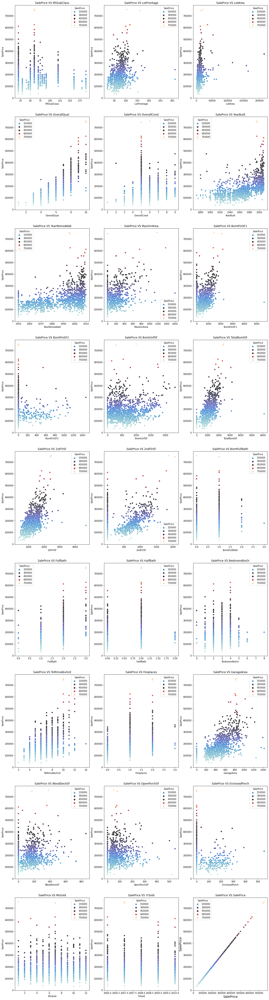

In [243]:
num_data = housing_clean.select_dtypes(include=['int64','float64'])

fig,axs= plt.subplots(9,3,figsize=(20,80))  # there are 26 indepnedent numerical features + SalePrice , so total 27
for i,ax in zip(num_data.columns,axs.flatten()):
    sns.scatterplot(x=i, y='SalePrice', hue='SalePrice',data=num_data,ax=ax,palette='icefire')
    plt.xlabel(i,fontsize = 14)
    plt.ylabel('SalePrice',fontsize = 14)
    ax.set_title('SalePrice'+' VS '+str(i))

Deductions from the above plots:

1. SalesPrice vs OverallQual : We can see stead rise in house price with increase in quality of house. 

2. SalesPrice vs YearBuilt / YearRemodAdd  : We can see that ouse prices increases with Year in both these cases. Which means, newer properties are costlier compared to older ones and same is true for Remodel properties. In both features, newer is costlier which makes absolute sense.

3. SalePrice vs YrSold and MoSold : Month in which house is sold has no effect on the sales price unlike year in which it was sold. From 2007 to 2010, house prices dropped down steadil (ignoring the outliers).

4. SalesPrice vs 1stFlrSF / 2ndFlrSF :  1st Floor Square Feet has a direct corelation with the price of the property and so is 2nd Floor Square Feet (Ignoring price change for zero 2ndFlrSF) 

5.  SalesPrice vs TotalBsmtSF / BsmtFinSF1 / GarageArea : Total square feet of basement area, which is linearly related with the total living area, also is directly proportional to the price of the property. And so is Type 1 basement finished square feet and GarageAre. However, these statements are true if we ignore the sales price change for zero TotalBsmtSF / BsmtFinSF1 / GarageArea.

6. SalesPrice vs FullBath / TotRmsAbvGrd : House prices increase withh increase in number of full bathroom as well as total number of rooms above ground, whic is logical.

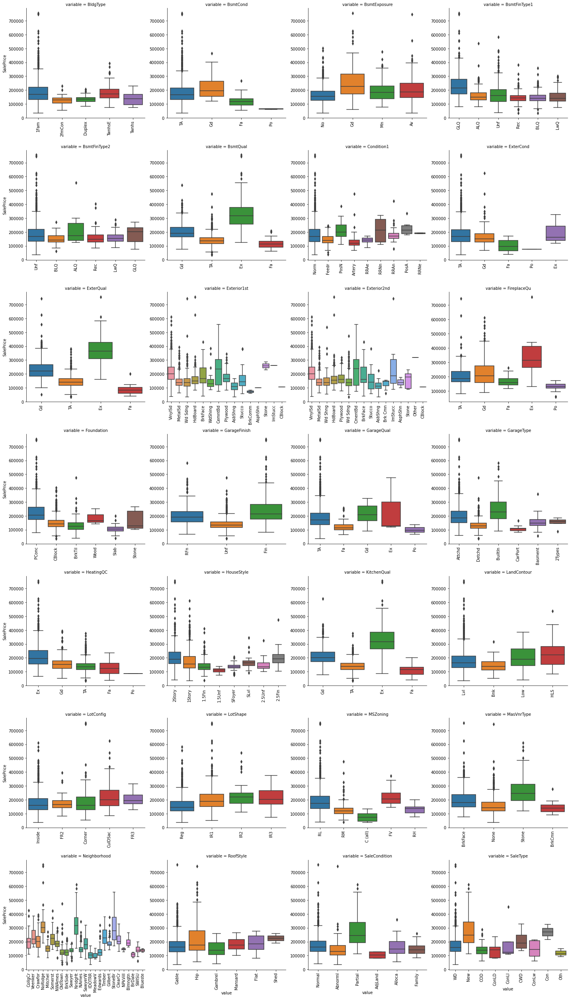

In [244]:
#Visualising Categorical Features v/s Target Variable

def facetgrid_boxplot(x, y, **kwargs):
    sns.boxplot(x=x, y=y)
    x=plt.xticks(rotation=90)
    
cat_data = housing_clean.select_dtypes(exclude=['int64','float64'])
f = pd.melt(housing_clean, id_vars=['SalePrice'], value_vars=sorted(housing_clean[cat_data.columns]))
g = sns.FacetGrid(f, col="variable", col_wrap=4, sharex=False, sharey=False, size=5)
g = g.map(facetgrid_boxplot, "value", "SalePrice")

Deductions from the above plots:

There are a few outliers which we need to look closely and manage by capping them to a lower percentile

1. Single-family Detached and Townhouse End Unit are sold relatively at higher prices than Two-family Conversion; originally built as one-family dwelling / Duplex / Townhouse Inside Unit. This might be because of high demand for single family houses.

2. Houses where the basement quality / condition / exposure is good and excellent are sold at higher prices compared to others. Similarly basement with good living quarter can fetch higher price for obvious reasons.

3. Houses with good and excellent garages / excellent kitchen quality / excellent exterior quality / excellent fireplace quality / excellent fire quality are sold at higher prices. All that makes logical sense.

4. Houses in certain neigboroods are more expensive than others which also in understandable. For example, Northridge Heights houses are the most expensive. The reason being, Northbridge is a suburb on the Lower North Shore of Sydney, New South Wales, Australia. It is located just 6 kilometres north of the Sydney Central Business District, in the local government area of the City of Willoughby. This makes Northridge Heights a premium neigborhhood. Similarl we can justify igh prices in Stone Brook neigborood and others.

5. SaleType 'New'- Home just constructed and sold,  and 'WD'-Warranty Deed - Conventional, and 'CWD'- Warranty Deed - Cash is preferred by te buyers than others and hence these are the features thhat can fetch high price.

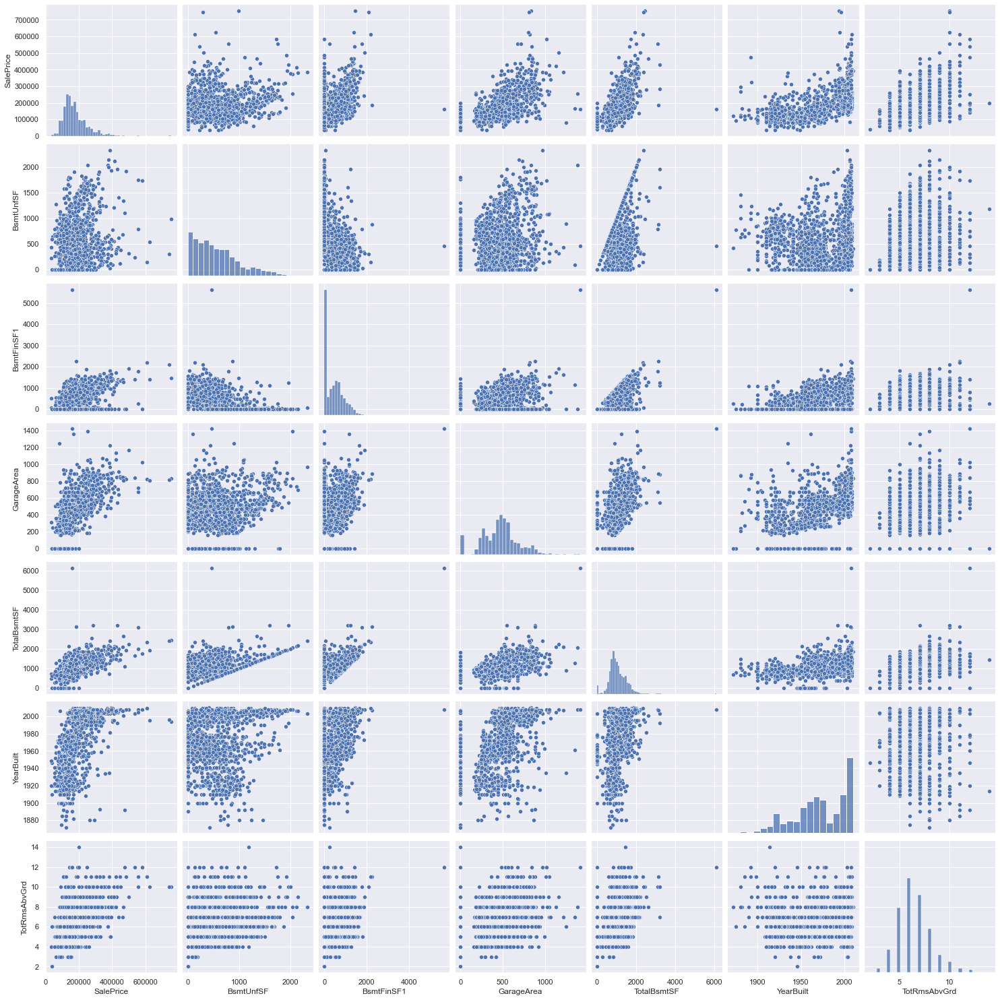

In [245]:
# cross-checking the above observations with pairplots for some select numerical features
sns.set()
cols = ['SalePrice', 'BsmtUnfSF', 'BsmtFinSF1', 'GarageArea', 'TotalBsmtSF', 'YearBuilt', 'TotRmsAbvGrd']
sns.pairplot(housing_clean[cols], size = 3)
plt.show()

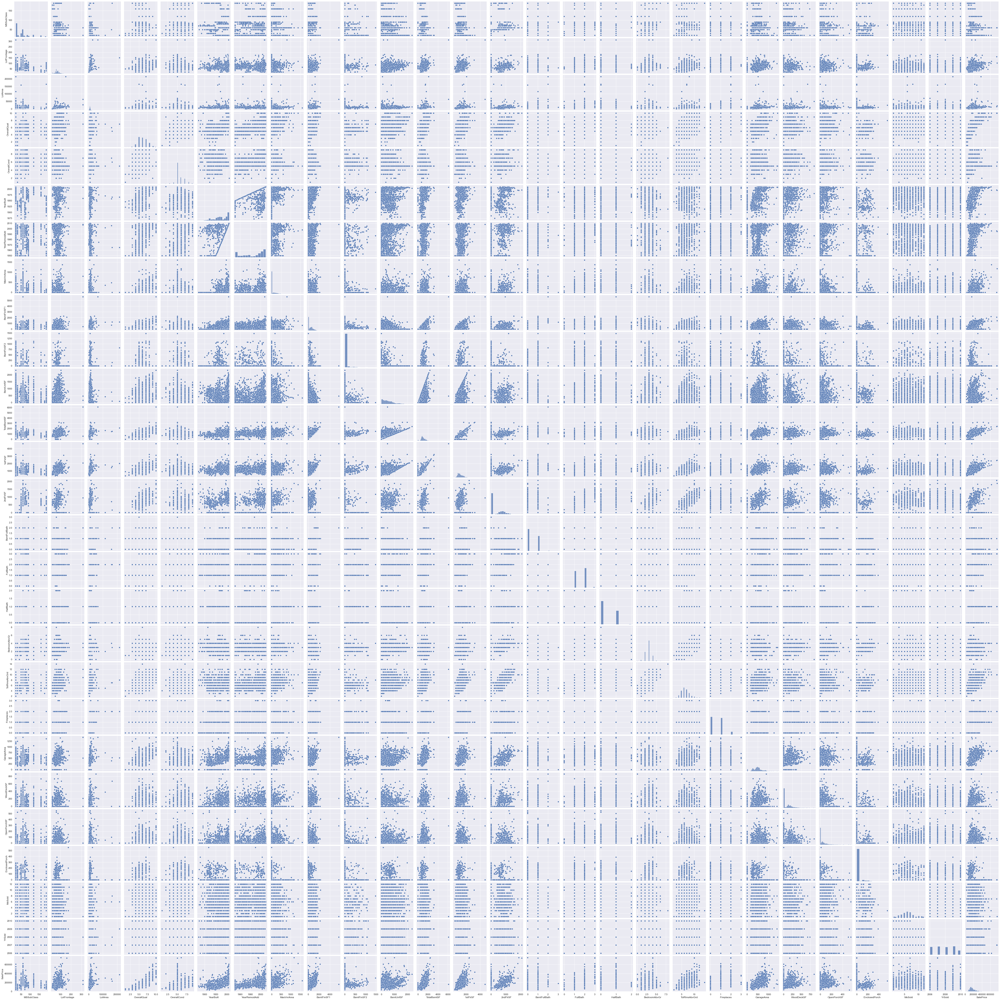

In [246]:
#Let's make a pairplot of all the numeric variables for a quick insight
sns.pairplot(housing[list(housing_clean.dtypes[housing.dtypes!='object'].index)])
plt.show()

#### We can see some strong correlation between sale price and some of these variables as obsereved earlier in the heatmap and scatter plots as well. Many of them look linearly related to sale price (ignoring outliers) and they are the ones to be used for training the model. We will identify them soon.

## STEP 4: Data Preparation
Data preperation is another important step before we start building the model. The decisions that data scientists / business leaders make are only as good as the data that supports them. Careful and comprehensive data preparation ensures analysts trust, understand, and ask better questions of their data, making their analysis more accurate and meaningful.

In [247]:
housing_clean.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 55 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   MSSubClass     1460 non-null   int64  
 1   MSZoning       1460 non-null   object 
 2   LotFrontage    1201 non-null   float64
 3   LotArea        1460 non-null   int64  
 4   LotShape       1460 non-null   object 
 5   LandContour    1460 non-null   object 
 6   LotConfig      1460 non-null   object 
 7   Neighborhood   1460 non-null   object 
 8   Condition1     1460 non-null   object 
 9   BldgType       1460 non-null   object 
 10  HouseStyle     1460 non-null   object 
 11  OverallQual    1460 non-null   int64  
 12  OverallCond    1460 non-null   int64  
 13  YearBuilt      1460 non-null   int64  
 14  YearRemodAdd   1460 non-null   int64  
 15  RoofStyle      1460 non-null   object 
 16  Exterior1st    1460 non-null   object 
 17  Exterior2nd    1460 non-null   object 
 18  MasVnrTy

### Replacing / Imputing null values in Numerical attributes by appropriate values (Mode / Median / Mean / Neighborhood / values from other related columns)

In [248]:
# check the null values in the numerical data

housing_clean.select_dtypes(include=['int64','float']).isnull().sum()[housing_clean.select_dtypes(include=['int64','float']).isnull().sum()>0]

LotFrontage    259
MasVnrArea       8
dtype: int64

In [249]:
# let us investigate these columns little more one by one
housing_clean['LotFrontage'].describe([0.25,0.50,0.75,0.99])

count    1201.000000
mean       70.049958
std        24.284752
min        21.000000
25%        59.000000
50%        69.000000
75%        80.000000
99%       141.000000
max       313.000000
Name: LotFrontage, dtype: float64

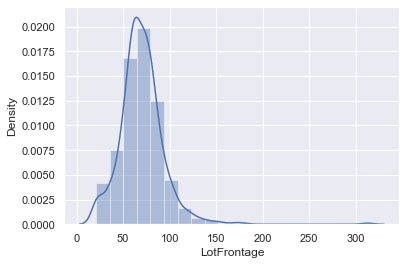

In [250]:
sns.distplot(housing_clean['LotFrontage'], bins=20)
plt.show()

This looks right skewed, so we cannot use 'mean'value to replace missing data. 'median' may be a better option instead.

However, as per the data dictionary "LotFrontage" is Linear feet of street connected to property

Since it is a numeric with a fair distribution, it can be imputed with similar 'neighborhood' values

In [251]:
housing_clean['MasVnrArea'].describe([0.25,0.50,0.75,0.99])

count    1452.000000
mean      103.685262
std       181.066207
min         0.000000
25%         0.000000
50%         0.000000
75%       166.000000
99%       791.920000
max      1600.000000
Name: MasVnrArea, dtype: float64

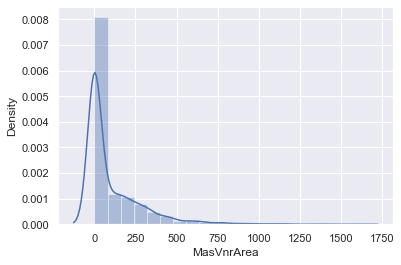

In [252]:
sns.distplot(housing_clean['MasVnrArea'], bins=20)
plt.show()

This too looks right skewed, so we cannot use 'mean'value to replace missing data. 'median' will be a better option instead.

In [253]:
# Imputing the null values with median values using similar Neigborood data for LotFrontage

housing_clean['LotFrontage'] = housing_clean.groupby('Neighborhood')["LotFrontage"].transform(lambda x: x.fillna(x.median()))
#housing_Clean['LotFrontage'] = housing_Clean['LotFrontage'].replace(np.nan, housing_Clean['LotFrontage'].median())

In [254]:
# Imputing the null values with median values for MasVnrArea

housing_clean['MasVnrArea'] = housing_clean['MasVnrArea'].replace(np.nan, housing_clean['MasVnrArea'].median())

In [255]:
# GarageYrBlt column was dropped due to its high correlation with year in which house was built , so commenting this part of code
''' 
# replacing the null values of GarageYrBlt with Year in which the house was built. This is a good guess with available information
print(housing_clean['GarageYrBlt'][39]) # just to check the replacement is happening properly
print(housing_clean['YearBuilt'][39])

#housing_Clean['GarageYrBlt'] = housing['GarageYrBlt'].replace(np.nan, housing['YearBuilt'])
housing_clean['GarageYrBlt'].fillna(housing_clean['YearBuilt'], inplace=True)
housing_clean['GarageYrBlt'] = housing_clean['GarageYrBlt'].astype(int)

print(housing_clean['GarageYrBlt'][39])
print(housing_clean['YearBuilt'][39])


#housing_Clean['GarageYrBlt']=housing_Clean['GarageYrBlt'].fillna(0)
'''

" \n# replacing the null values of GarageYrBlt with Year in which the house was built. This is a good guess with available information\nprint(housing_clean['GarageYrBlt'][39]) # just to check the replacement is happening properly\nprint(housing_clean['YearBuilt'][39])\n\n#housing_Clean['GarageYrBlt'] = housing['GarageYrBlt'].replace(np.nan, housing['YearBuilt'])\nhousing_clean['GarageYrBlt'].fillna(housing_clean['YearBuilt'], inplace=True)\nhousing_clean['GarageYrBlt'] = housing_clean['GarageYrBlt'].astype(int)\n\nprint(housing_clean['GarageYrBlt'][39])\nprint(housing_clean['YearBuilt'][39])\n\n\n#housing_Clean['GarageYrBlt']=housing_Clean['GarageYrBlt'].fillna(0)\n"

####  Let us Crosscheck both updated columns to ensure that by repplacing missing values we have not changed the distribution significantly

In [256]:
housing_clean['LotFrontage'].describe([0.25,0.50,0.75,0.99])

count    1460.000000
mean       70.199658
std        22.431902
min        21.000000
25%        60.000000
50%        70.000000
75%        80.000000
99%       137.410000
max       313.000000
Name: LotFrontage, dtype: float64

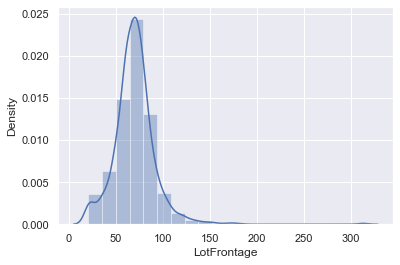

In [257]:
sns.distplot(housing_clean['LotFrontage'], bins=20)
plt.show()

In [258]:
housing_clean['MasVnrArea'].describe([0.25,0.50,0.75,0.99])

count    1460.000000
mean      103.117123
std       180.731373
min         0.000000
25%         0.000000
50%         0.000000
75%       164.250000
99%       791.280000
max      1600.000000
Name: MasVnrArea, dtype: float64

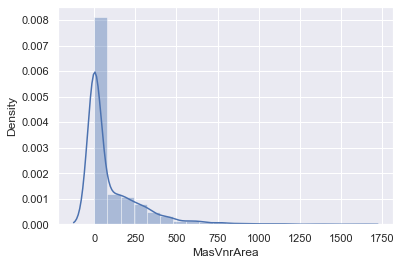

In [259]:
sns.distplot(housing_clean['MasVnrArea'], bins=20)
plt.show()

#### The description and distribution plots show that the replaced values are not affecting the distribution and hence  the choices we made imputed values are good

### Replacing / Imputing null values in Categorical attributes

In [260]:
# check for null values in all categorical columns

housing_clean.select_dtypes(include='object').isnull().sum()[housing_clean.select_dtypes(include='object').isnull().sum()>0]

MasVnrType        8
BsmtQual         37
BsmtCond         37
BsmtExposure     38
BsmtFinType1     37
BsmtFinType2     38
FireplaceQu     690
GarageType       81
GarageFinish     81
GarageQual       81
dtype: int64

In [261]:
# Replace NA with None in the following columns below : 

for col in categorical_features:
    housing_clean[col] = housing_clean[col].fillna('None')
housing_clean['FireplaceQu'].head(10) # checking to ensure that NA is replaced by None in just one column which had maximum NA values

0    None
1      TA
2      TA
3      Gd
4      TA
5    None
6      Gd
7      TA
8      TA
9      TA
Name: FireplaceQu, dtype: object

### Creating new more useful and meanigful features (columns) using existing ones

In [262]:
# Creating a new column named is_Remodelled: This column will indicate if the house was remodelled or not based on 
# the difference between remodelled and built years

def check_for_Remodel(row):
    if(row['YearBuilt'] == row['YearRemodAdd']):
        return 0
    elif(row['YearBuilt'] < row['YearRemodAdd']):
        return 1
    else:
        return 2
    
housing_clean['is_Remodelled'] = housing_clean.apply(check_for_Remodel, axis=1)
housing_clean.head()    

,MSSubClass,MSZoning,LotFrontage,LotArea,LotShape,LandContour,LotConfig,Neighborhood,Condition1,BldgType,...,GarageQual,WoodDeckSF,OpenPorchSF,EnclosedPorch,MoSold,YrSold,SaleType,SaleCondition,SalePrice,is_Remodelled
0,60,RL,65.0,8450,Reg,Lvl,Inside,CollgCr,Norm,1Fam,...,TA,0,61,0,2,2008,WD,Normal,208500,0
1,20,RL,80.0,9600,Reg,Lvl,FR2,Veenker,Feedr,1Fam,...,TA,298,0,0,5,2007,WD,Normal,181500,0
2,60,RL,68.0,11250,IR1,Lvl,Inside,CollgCr,Norm,1Fam,...,TA,0,42,0,9,2008,WD,Normal,223500,1
3,70,RL,60.0,9550,IR1,Lvl,Corner,Crawfor,Norm,1Fam,...,TA,0,35,272,2,2006,WD,Abnorml,140000,1
4,60,RL,84.0,14260,IR1,Lvl,FR2,NoRidge,Norm,1Fam,...,TA,192,84,0,12,2008,WD,Normal,250000,0


#### A lot of features have year related to it. While we figured out the year in which house is sold has high impact on sale price, most other year based features makes more sense if we find out age instead of absolute year. So let us find age and add that as new column for eac of tose year-based features.

In [263]:
# Creating new Columns to capture age of the remodel
housing_clean['remodel_age'] = housing_clean['YrSold'] - housing_clean['YearRemodAdd']

In [264]:
# Creating new Columns to capture age of the property
# a new column house_age which is basically Built or Remodelled age, whichever is smaller 

def get_house_age(row):
    if(row['YearBuilt'] == row['YearRemodAdd']):
        return row['YrSold'] - row['YearBuilt']
    else:
        return row['YrSold'] - row['YearRemodAdd']
       
housing_clean['house_age'] = housing_clean.apply(get_house_age, axis=1)

In [265]:
# now we can drop 'YearBuilt' and 'YearRemodAdd'
housing_clean.drop(['YearBuilt', 'YearRemodAdd'], axis='columns', inplace=True)

In [266]:
housing_clean.head()

,MSSubClass,MSZoning,LotFrontage,LotArea,LotShape,LandContour,LotConfig,Neighborhood,Condition1,BldgType,...,OpenPorchSF,EnclosedPorch,MoSold,YrSold,SaleType,SaleCondition,SalePrice,is_Remodelled,remodel_age,house_age
0,60,RL,65.0,8450,Reg,Lvl,Inside,CollgCr,Norm,1Fam,...,61,0,2,2008,WD,Normal,208500,0,5,5
1,20,RL,80.0,9600,Reg,Lvl,FR2,Veenker,Feedr,1Fam,...,0,0,5,2007,WD,Normal,181500,0,31,31
2,60,RL,68.0,11250,IR1,Lvl,Inside,CollgCr,Norm,1Fam,...,42,0,9,2008,WD,Normal,223500,1,6,6
3,70,RL,60.0,9550,IR1,Lvl,Corner,Crawfor,Norm,1Fam,...,35,272,2,2006,WD,Abnorml,140000,1,36,36
4,60,RL,84.0,14260,IR1,Lvl,FR2,NoRidge,Norm,1Fam,...,84,0,12,2008,WD,Normal,250000,0,8,8


In [267]:
housing_clean.shape

(1460, 56)

### Managing Outliers
Outliers are those data points that are significantly different from the rest of the dataset. They are often abnormal observations that skew the data distribution, and arise due to inconsistent data entry, or erroneous observations. If not managed, outliers can affect the regression training negatively.

So let us first look at them closely and then decide if they need any actions.

In [268]:
# Checking outliers at 25%,50%,75%,90%,95% and above

housing_clean.describe(percentiles=[.25,.5,.75,.90,.95,.99])

,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,...,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,MoSold,YrSold,SalePrice,is_Remodelled,remodel_age,house_age
count,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,...,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000
mean,56.897260,70.199658,10516.828082,6.099315,5.575342,103.117123,443.639726,46.549315,567.240411,1057.429452,...,472.980137,94.244521,46.660274,21.954110,6.321918,2007.815753,180921.195890,0.476712,22.950000,22.950000
std,42.300571,22.431902,9981.264932,1.382997,1.112799,180.731373,456.098091,161.319273,441.866955,438.705324,...,213.804841,125.338794,66.256028,61.119149,2.703626,1.328095,79442.502883,0.499629,20.640653,20.640653
min,20.000000,21.000000,1300.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,1.000000,2006.000000,34900.000000,0.000000,-1.000000,-1.000000
25%,20.000000,60.000000,7553.500000,5.000000,5.000000,0.000000,0.000000,0.000000,223.000000,795.750000,...,334.500000,0.000000,0.000000,0.000000,5.000000,2007.000000,129975.000000,0.000000,4.000000,4.000000
50%,50.000000,70.000000,9478.500000,6.000000,5.000000,0.000000,383.500000,0.000000,477.500000,991.500000,...,480.000000,0.000000,25.000000,0.000000,6.000000,2008.000000,163000.000000,0.000000,14.000000,14.000000
75%,70.000000,80.000000,11601.500000,7.000000,6.000000,164.250000,712.250000,0.000000,808.000000,1298.250000,...,576.000000,168.000000,68.000000,0.000000,8.000000,2009.000000,214000.000000,1.000000,41.000000,41.000000
90%,120.000000,92.000000,14381.700000,8.000000,7.000000,335.000000,1065.500000,117.200000,1232.000000,1602.200000,...,757.100000,262.000000,130.000000,112.000000,10.000000,2010.000000,278000.000000,1.000000,56.000000,56.000000
95%,160.000000,104.000000,17401.150000,8.000000,8.000000,456.000000,1274.000000,396.200000,1468.000000,1753.000000,...,850.100000,335.000000,175.050000,180.150000,11.000000,2010.000000,326100.000000,1.000000,58.000000,58.000000
99%,190.000000,137.410000,37567.640000,10.000000,9.000000,791.280000,1572.410000,830.380000,1797.050000,2155.050000,...,1002.790000,505.460000,285.820000,261.050000,12.000000,2010.000000,442567.010000,1.000000,60.000000,60.000000


In [269]:
num_data = housing_clean.select_dtypes(include=['int64','float64'])
print(num_data.shape)
print(num_data.columns)
[rows, cols] = num_data.shape

(1460, 28)
Index(['MSSubClass', 'LotFrontage', 'LotArea', 'OverallQual', 'OverallCond',
       'MasVnrArea', 'BsmtFinSF1', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF',
       '1stFlrSF', '2ndFlrSF', 'BsmtFullBath', 'FullBath', 'HalfBath',
       'BedroomAbvGr', 'TotRmsAbvGrd', 'Fireplaces', 'GarageArea',
       'WoodDeckSF', 'OpenPorchSF', 'EnclosedPorch', 'MoSold', 'YrSold',
       'SalePrice', 'is_Remodelled', 'remodel_age', 'house_age'],
      dtype='object')


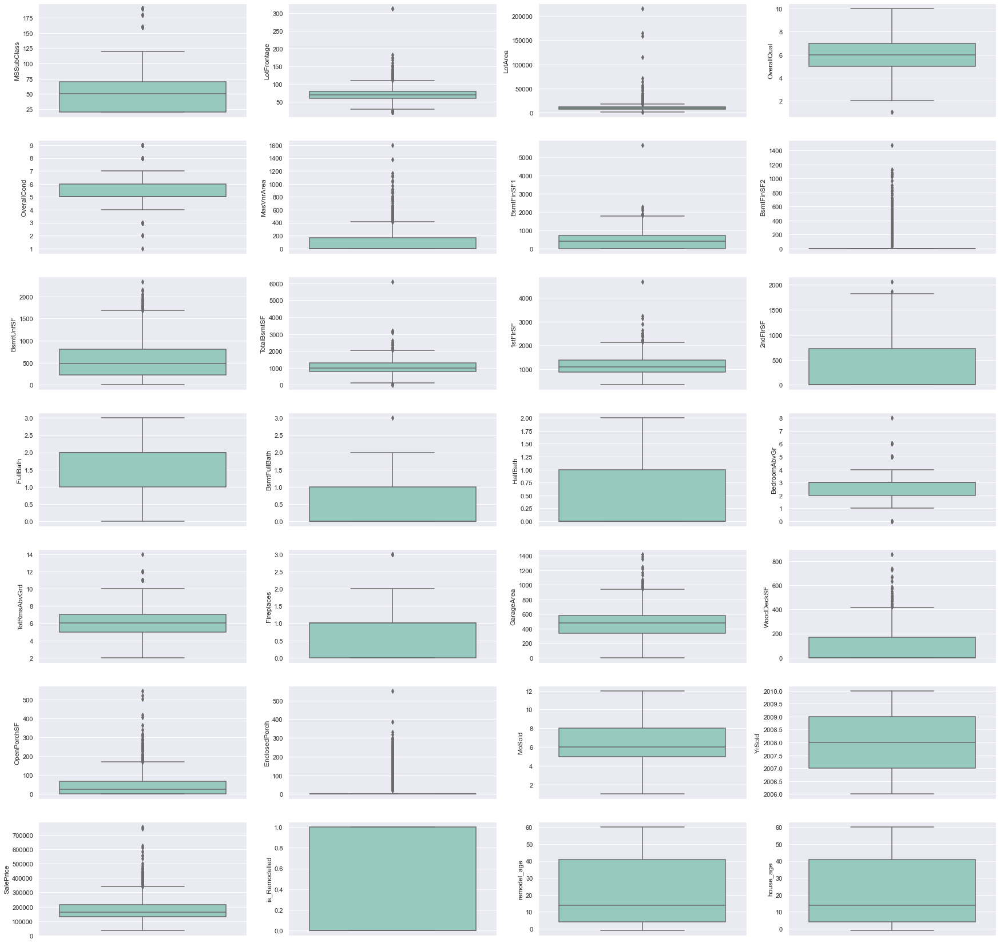

In [270]:
# Visualizing the outliers in all numeric columns

plt.figure(figsize=(30, 30))
plt.subplot(7,4,1)
sns.boxplot(y = 'MSSubClass', palette='Set3', data = housing_clean)

plt.subplot(7,4,2)
sns.boxplot(y = 'LotFrontage', palette='Set3', data = housing_clean)

plt.subplot(7,4,3)
sns.boxplot(y = 'LotArea', palette='Set3', data = housing_clean)

plt.subplot(7,4,4)
sns.boxplot(y = 'OverallQual', palette='Set3', data = housing_clean)

plt.subplot(7,4,5)
sns.boxplot(y = 'OverallCond', palette='Set3', data = housing_clean)

plt.subplot(7,4,6)
sns.boxplot(y = 'MasVnrArea', palette='Set3', data = housing_clean)

plt.subplot(7,4,7)
sns.boxplot(y = 'BsmtFinSF1', palette='Set3', data = housing_clean)

plt.subplot(7,4,8)
sns.boxplot(y = 'BsmtFinSF2', palette='Set3', data = housing_clean)

plt.subplot(7,4,9)
sns.boxplot(y = 'BsmtUnfSF', palette='Set3', data = housing_clean)

plt.subplot(7,4,10)
sns.boxplot(y = 'TotalBsmtSF', palette='Set3', data = housing_clean)

plt.subplot(7,4,11)
sns.boxplot(y = '1stFlrSF', palette='Set3', data = housing_clean)

plt.subplot(7,4,12)
sns.boxplot(y = '2ndFlrSF', palette='Set3', data = housing_clean)

plt.subplot(7,4,13)
sns.boxplot(y = 'FullBath', palette='Set3', data = housing_clean)

plt.subplot(7,4,14)
sns.boxplot(y = 'BsmtFullBath', palette='Set3', data = housing_clean)

plt.subplot(7,4,15)
sns.boxplot(y = 'HalfBath', palette='Set3', data = housing_clean)

plt.subplot(7,4,16)
sns.boxplot(y = 'BedroomAbvGr', palette='Set3', data = housing_clean)

plt.subplot(7,4,17)
sns.boxplot(y = 'TotRmsAbvGrd', palette='Set3', data = housing_clean)

plt.subplot(7,4,18)
sns.boxplot(y = 'Fireplaces', palette='Set3', data = housing_clean)

plt.subplot(7,4,19)
sns.boxplot(y = 'GarageArea', palette='Set3', data = housing_clean)

plt.subplot(7, 4, 20)
sns.boxplot(y = 'WoodDeckSF', palette='Set3', data = housing_clean)

plt.subplot(7, 4, 21)
sns.boxplot(y = 'OpenPorchSF', palette='Set3', data = housing_clean)

plt.subplot(7, 4, 22)
sns.boxplot(y = 'EnclosedPorch', palette='Set3', data = housing_clean)

plt.subplot(7, 4, 23)
sns.boxplot(y = 'MoSold', palette='Set3', data = housing_clean)

plt.subplot(7, 4, 24)
sns.boxplot(y = 'YrSold', palette='Set3', data = housing_clean)

plt.subplot(7, 4, 25)
sns.boxplot(y = 'SalePrice', palette='Set3', data = housing_clean)

plt.subplot(7, 4, 26)
sns.boxplot(y = 'is_Remodelled', palette='Set3', data = housing_clean)

plt.subplot(7, 4, 27)
sns.boxplot(y = 'remodel_age', palette='Set3', data = housing_clean)

plt.subplot(7, 4, 28)
sns.boxplot(y = 'house_age', palette='Set3', data = housing_clean)

    
plt.show()

#### The outliers that are almost continous above the max point or below the min point, are not really going to affect the regression line , So we do not have to worry about following features:
    -BsmtUnfSF, 1stFlrSF, FullBath, halfBath, GarageArea, WoodDeckSF, MoSold, YrSold, is_Remodeelled, remodel_age, house_age
#### The ones which are far or random are the problametic ones and should be either imputed or removed
#### We will take that call after some more analysis

In [271]:
# Z score analysis of all numerical features' distributions
# Now to define an outlier threshold value is chosen which is generally 3.0
# As 99.7% of the data points lie between +/- 3 standard deviation (using Gaussian Distribution approach)


from scipy import stats
import numpy as np
 
z = np.abs(stats.zscore(housing_clean['MSSubClass']))
#print(z )
count = (z > 3).sum()
print('number of outliers in "MSSubClass" = {} , % of outliers = {} %'.format(count, int(count*100/1460)))


z = np.abs(stats.zscore(housing_clean['LotFrontage']))
#print(z )
count = (z > 3).sum()
print('number of outliers in "LotFrontage" = {} , % of outliers = {} %'.format(count, int(count*100/1460)))


z = np.abs(stats.zscore(housing_clean['LotArea']))
#print(z )
count = (z > 3).sum()
print('number of outliers in "LotArea" = {} , % of outliers = {} %'.format(count, int(count*100/1460)))


z = np.abs(stats.zscore(housing_clean['OverallQual']))
#print(z )
count = (z > 3).sum()
print('number of outliers in "OverallQual" = {} , % of outliers = {} %'.format(count, int(count*100/1460)))


z = np.abs(stats.zscore(housing_clean['OverallCond']))
#print(z )
count = (z > 3).sum()
print('number of outliers in "OverallCond" = {} , % of outliers = {} %'.format(count, int(count*100/1460)))


z = np.abs(stats.zscore(housing_clean['MasVnrArea']))
#print(z )
count = (z > 3).sum()
print('number of outliers in "MasVnrArea" = {} , % of outliers = {} %'.format(count, int(count*100/rows)))


z = np.abs(stats.zscore(housing_clean['BsmtFinSF1']))
#print(z )
count = (z > 3).sum()
print('number of outliers in "BsmtFinSF1" = {} , % of outliers = {} %'.format(count, int(count*100/1460)))



z = np.abs(stats.zscore(housing_clean['BsmtFinSF2']))
#print(z )
count = (z > 3).sum()
print('number of outliers in "BsmtFinSF2" = {} , % of outliers = {} %'.format(count, int(count*100/1460)))



z = np.abs(stats.zscore(housing_clean['BsmtUnfSF']))
#print(z )
count = (z > 3).sum()
print('number of outliers in "BsmtUnfSF" = {} , % of outliers = {} %'.format(count, int(count*100/1460)))



z = np.abs(stats.zscore(housing_clean['TotalBsmtSF']))
#print(z )
count = (z > 3).sum()
print('number of outliers in "TotalBsmtSF" = {} , % of outliers = {} %'.format(count, int(count*100/1460)))



z = np.abs(stats.zscore(housing_clean['1stFlrSF']))
#print(z )
count = (z > 3).sum()
print('number of outliers in "1stFlrSF" = {} , % of outliers = {} %'.format(count, int(count*100/1460)))



z = np.abs(stats.zscore(housing_clean['2ndFlrSF']))
#print(z )
count = (z > 3).sum()
print('number of outliers in "2ndFlrSF" = {} , % of outliers = {} %'.format(count, int(count*100/1460)))


''' 
z = np.abs(stats.zscore(housing_clean['GrLivArea']))
#print(z )
count = (z > 3).sum()
print('number of outliers in "GrLivArea" = {} , % of outliers = {} %'.format(count, int(count*100/1460)))
''' 


z = np.abs(stats.zscore(housing_clean['BsmtFullBath']))
#print(z )
count = (z > 3).sum()
print('number of outliers in "BsmtFullBath" = {} , % of outliers = {} %'.format(count, int(count*100/1460)))



z = np.abs(stats.zscore(housing_clean['FullBath']))
#print(z )
count = (z > 3).sum()
print('number of outliers in "FullBath" = {} , % of outliers = {} %'.format(count, int(count*100/1460)))



z = np.abs(stats.zscore(housing_clean['HalfBath']))
#print(z )
count = (z > 3).sum()
print('number of outliers in "HalfBath" = {} , % of outliers = {} %'.format(count, int(count*100/1460)))



z = np.abs(stats.zscore(housing_clean['BedroomAbvGr']))
#print(z )
count = (z > 3).sum()
print('number of outliers in "BedroomAbvGr" = {} , % of outliers = {} %'.format(count, int(count*100/1460)))


z = np.abs(stats.zscore(housing_clean['TotRmsAbvGrd']))
#print(z )
count = (z > 3).sum()
print('number of outliers in "TotRmsAbvGrd" = {} , % of outliers = {} %'.format(count, int(count*100/1460)))

''' 
z = np.abs(stats.zscore(housing_clean['GarageCars']))
#print(z )
count = (z > 3).sum()
print('number of outliers in "GarageCars" = {} , % of outliers = {} %'.format(count, int(count*100/1460)))
'''


z = np.abs(stats.zscore(housing_clean['GarageArea']))
#print(z )
count = (z > 3).sum()
print('number of outliers in "GarageArea" = {} , % of outliers = {} %'.format(count, int(count*100/1460)))



z = np.abs(stats.zscore(housing_clean['WoodDeckSF']))
#print(z )
count = (z > 3).sum()
print('number of outliers in "WoodDeckSF" = {} , % of outliers = {} %'.format(count, int(count*100/1460)))


z = np.abs(stats.zscore(housing_clean['OpenPorchSF']))
#print(z )
count = (z > 3).sum()
print('number of outliers in "OpenPorchSF" = {} , % of outliers = {} %'.format(count, int(count*100/1460)))



z = np.abs(stats.zscore(housing_clean['EnclosedPorch']))
#print(z )
count = (z > 3).sum()
print('number of outliers in "EnclosedPorch" = {} , % of outliers = {} %'.format(count, int(count*100/1460)))



z = np.abs(stats.zscore(housing_clean['MoSold']))
#print(z )
count = (z > 3).sum()
print('number of outliers in "MoSold" = {} , % of outliers = {} %'.format(count, int(count*100/1460)))



z = np.abs(stats.zscore(housing_clean['YrSold']))
#print(z )
count = (z > 3).sum()
print('number of outliers in "YrSold" = {} , % of outliers = {} %'.format(count, int(count*100/1460)))



z = np.abs(stats.zscore(housing_clean['SalePrice']))
#print(z )
count = (z > 3).sum()
print('number of outliers in "SalePrice" = {} , % of outliers = {} %'.format(count, int(count*100/1460)))



z = np.abs(stats.zscore(housing_clean['is_Remodelled']))
#print(z )
count = (z > 3).sum()
print('number of outliers in "is_Remodelled" = {} , % of outliers = {} %'.format(count, int(count*100/1460)))


z = np.abs(stats.zscore(housing_clean['remodel_age']))
#print(z )
count = (z > 3).sum()
print('number of outliers in "remodel_age" = {} , % of outliers = {} %'.format(count, int(count*100/1460)))



z = np.abs(stats.zscore(housing_clean['house_age']))
#print(z )
count = (z > 3).sum()
print('number of outliers in "house_age" = {} , % of outliers = {} %'.format(count, int(count*100/1460)))


number of outliers in "MSSubClass" = 30 , % of outliers = 2 %
number of outliers in "LotFrontage" = 15 , % of outliers = 1 %
number of outliers in "LotArea" = 13 , % of outliers = 0 %
number of outliers in "OverallQual" = 2 , % of outliers = 0 %
number of outliers in "OverallCond" = 28 , % of outliers = 1 %
number of outliers in "MasVnrArea" = 32 , % of outliers = 2 %
number of outliers in "BsmtFinSF1" = 6 , % of outliers = 0 %
number of outliers in "BsmtFinSF2" = 50 , % of outliers = 3 %
number of outliers in "BsmtUnfSF" = 11 , % of outliers = 0 %
number of outliers in "TotalBsmtSF" = 10 , % of outliers = 0 %
number of outliers in "1stFlrSF" = 12 , % of outliers = 0 %
number of outliers in "2ndFlrSF" = 4 , % of outliers = 0 %
number of outliers in "BsmtFullBath" = 16 , % of outliers = 1 %
number of outliers in "FullBath" = 0 , % of outliers = 0 %
number of outliers in "HalfBath" = 12 , % of outliers = 0 %
number of outliers in "BedroomAbvGr" = 14 , % of outliers = 0 %
number of outlie

#### It is clear from above statements that % of outliers are not too big and hence we can remove the outliers without any significant loss of data or infomration. Imputation if not done with good amount of knowledge can adversel affect training and hence I want to avoid that

#### We shall remove outliers for features other than (  BsmtUnfSF, 1stFlrSF, FullBath, halfBath, GarageArea, WoodDeckSF, MoSold, YrSold, is_Remodeelled, remodel_age, house_age )

In [272]:
# Removing Outliers values beyond 99.7% for all the features that has more than 0 outliers

# removal of data is done on the copy of dataframe namely temp_data , 
#once we ensure that data lost is not signoficant, we can cop this new reduced data back to original dataframe variable
temp_data = housing_clean.copy()

nn_quartile_LotArea = temp_data['MSSubClass'].quantile(0.997)
temp_data = temp_data[temp_data["MSSubClass"] < nn_quartile_LotArea]

nn_quartile_LotArea = temp_data['LotFrontage'].quantile(0.997)
temp_data = temp_data[temp_data["LotFrontage"] < nn_quartile_LotArea]

nn_quartile_LotArea = temp_data['LotArea'].quantile(0.997)
temp_data = temp_data[temp_data["LotArea"] < nn_quartile_LotArea]

nn_quartile_LotArea = temp_data['OverallQual'].quantile(0.997)
temp_data = temp_data[temp_data["OverallQual"] < nn_quartile_LotArea]

nn_quartile_LotArea = temp_data['OverallCond'].quantile(0.997)
temp_data = temp_data[temp_data["OverallCond"] < nn_quartile_LotArea]

nn_quartile_MasVnrArea = temp_data['MasVnrArea'].quantile(0.997)
temp_data = temp_data[temp_data["MasVnrArea"] < nn_quartile_MasVnrArea]

nn_quartile_LotArea = temp_data['BsmtFinSF1'].quantile(0.997)
temp_data = temp_data[temp_data["BsmtFinSF1"] < nn_quartile_LotArea]

nn_quartile_LotArea = temp_data['BsmtFinSF2'].quantile(0.997)
temp_data = temp_data[temp_data["BsmtFinSF2"] < nn_quartile_LotArea]

nn_quartile_LotArea = temp_data['TotalBsmtSF'].quantile(0.997)
temp_data = temp_data[temp_data["TotalBsmtSF"] < nn_quartile_LotArea]

#nn_quartile_LotArea = temp_data['1stFlrSF'].quantile(0.997)
#temp_data = temp_data[temp_data["1stFlrSF"] < nn_quartile_LotArea]

nn_quartile_LotArea = temp_data['2ndFlrSF'].quantile(0.997)
temp_data = temp_data[temp_data["2ndFlrSF"] < nn_quartile_LotArea]

nn_quartile_LotArea = temp_data['BsmtFullBath'].quantile(0.997)
temp_data = temp_data[temp_data["BsmtFullBath"] < nn_quartile_LotArea]

#nn_quartile_LotArea = temp_data['HalfBath'].quantile(0.997)
#temp_data = temp_data[temp_data["HalfBath"] < nn_quartile_LotArea]

nn_quartile_LotArea = temp_data['BedroomAbvGr'].quantile(0.997)
temp_data = temp_data[temp_data["BedroomAbvGr"] < nn_quartile_LotArea]

nn_quartile_LotArea = temp_data['TotRmsAbvGrd'].quantile(0.997)
temp_data = temp_data[temp_data["TotRmsAbvGrd"] < nn_quartile_LotArea]

#nn_quartile_LotArea = temp_data['GarageArea'].quantile(0.997)
#temp_data = temp_data[temp_data["GarageArea"] < nn_quartile_LotArea]

#nn_quartile_WoodDeckSF = temp_data['WoodDeckSF'].quantile(0.997)
#temp_data = temp_data[temp_data["WoodDeckSF"] < nn_quartile_WoodDeckSF]

nn_quartile_LotArea = temp_data['OpenPorchSF'].quantile(0.997)
temp_data = temp_data[temp_data["OpenPorchSF"] < nn_quartile_LotArea]

nn_quartile_LotArea = temp_data['EnclosedPorch'].quantile(0.997)
temp_data = temp_data[temp_data["EnclosedPorch"] < nn_quartile_LotArea]

#nn_quartile_OpenPorchSF = temp_data['SalePrice'].quantile(0.997)
#temp_data = temp_data[temp_data["SalePrice"] < nn_quartile_OpenPorchSF]

In [273]:
#Determine the percentage of data retained

reduced_data_size = round(100*(len(temp_data)/rows),2)
print(reduced_data_size)


90.82


#### With around 9% of data lost if we can get rid of the outliers and get a better regression line, it is a good deal. So copying this reduced better qualit data to housing_clean back

In [274]:
housing_clean = temp_data.copy()

### Create Dummy Variables

Encoding: 
- Converting binary vars to 1/0:
    We do not have any binary variables, so this is not needed
- Converting ordered categorical data to ordered numerical values
- Converting other catagorical vars to dummy vars:
  But before creating dummy variables, we need to convert them into 'category' data types

#### Ordered categorical features:
1. ExterQual: Evaluates the quality of the material on the exterior 
		
       Ex	Excellent
       Gd	Good
       TA	Average/Typical
       Fa	Fair
       Po	Poor
       
2. ExterCond: Evaluates the present condition of the material on the exterior
		
       Ex	Excellent
       Gd	Good
       TA	Average/Typical
       Fa	Fair
       Po	Poor
     
3. BsmtQual: Evaluates the height of the basement

       Ex	Excellent (100+ inches)	
       Gd	Good (90-99 inches)
       TA	Typical (80-89 inches)
       Fa	Fair (70-79 inches)
       Po	Poor (<70 inches
       NA	No Basement
		
4. BsmtCond: Evaluates the general condition of the basement

       Ex	Excellent
       Gd	Good
       TA	Typical - slight dampness allowed
       Fa	Fair - dampness or some cracking or settling
       Po	Poor - Severe cracking, settling, or wetness
       NA	No Basement
	
5. BsmtExposure: Refers to walkout or garden level walls

       Gd	Good Exposure
       Av	Average Exposure (split levels or foyers typically score average or above)	
       Mn	Mimimum Exposure
       No	No Exposure
       NA	No Basement
       
6. BsmtFinType2: Rating of basement finished area (if multiple types)

       GLQ	Good Living Quarters
       ALQ	Average Living Quarters
       BLQ	Below Average Living Quarters	
       Rec	Average Rec Room
       LwQ	Low Quality
       Unf	Unfinshed
       NA	No Basement

7. HeatingQC: Heating quality and condition

       Ex	Excellent
       Gd	Good
       TA	Average/Typical
       Fa	Fair
       Po	Poor

8. KitchenQual: Kitchen quality

       Ex	Excellent
       Gd	Good
       TA	Typical/Average
       Fa	Fair
       Po	Poor
       	
9. FireplaceQu: Fireplace quality

       Ex	Excellent - Exceptional Masonry Fireplace
       Gd	Good - Masonry Fireplace in main level
       TA	Average - Prefabricated Fireplace in main living area or Masonry Fireplace in basement
       Fa	Fair - Prefabricated Fireplace in basement
       Po	Poor - Ben Franklin Stove
       NA	No Fireplace
		
        
10. GarageFinish: Interior finish of the garage

           Fin	Finished
           RFn	Rough Finished	
           Unf	Unfinished
           NA	No Garage
	
    
11. GarageQual: Garage quality

           Ex	Excellent
           Gd	Good
           TA	Typical/Average
           Fa	Fair
           Po	Poor
           NA	No Garage	

In [275]:
housing_clean['ExterQual'] = housing_clean['ExterQual'].map({'Ex': 4, 'Gd': 3, 'TA': 2, 'Fa': 1, 'Po' : 0})
housing_clean['ExterCond'] = housing_clean['ExterCond'].map({'Ex': 4, 'Gd': 3, 'TA': 2, 'Fa': 1, 'Po' : 0})
housing_clean['BsmtQual'] = housing_clean['BsmtQual'].map({'Ex': 5, 'Gd': 4, 'TA': 3, 'Fa': 2, 'Po': 1, 'NA' : 0})
housing_clean['BsmtCond'] = housing_clean['BsmtCond'].map({'Ex': 5, 'Gd': 4, 'TA': 3, 'Fa': 2, 'Po': 1, 'NA' : 0})
housing_clean['BsmtExposure'] = housing_clean['BsmtExposure'].map({'Gd': 4, 'Av': 3, 'Mn': 2, 'No': 1, 'NA' : 0})
housing_clean['BsmtFinType2'] = housing_clean['BsmtFinType2'].map({'GLQ': 6, 'ALQ': 5, 'BLQ': 4, 'Rec': 3, 'LwQ': 2, 'Unf': 1, 'NA' : 0})
housing_clean['HeatingQC'] = housing_clean['HeatingQC'].map({'Ex': 4, 'Gd': 3, 'TA': 2, 'Fa': 1, 'Po' : 0})
housing_clean['KitchenQual'] = housing_clean['KitchenQual'].map({'Ex': 4, 'Gd': 3, 'TA': 2, 'Fa': 1, 'Po' : 0})
housing_clean['FireplaceQu'] = housing_clean['FireplaceQu'].map({'Ex': 5, 'Gd': 4, 'TA': 3, 'Fa': 2, 'Po': 1, 'NA' : 0})
housing_clean['GarageFinish'] = housing_clean['GarageFinish'].map({'Fin': 3, 'RFn': 2, 'Unf': 1, 'NA' : 0})
housing_clean['GarageQual'] = housing_clean['GarageQual'].map({'Ex': 5, 'Gd': 4, 'TA': 3, 'Fa': 2, 'Po': 1, 'NA' : 0})

In [276]:
housing_clean.head()

,MSSubClass,MSZoning,LotFrontage,LotArea,LotShape,LandContour,LotConfig,Neighborhood,Condition1,BldgType,...,OpenPorchSF,EnclosedPorch,MoSold,YrSold,SaleType,SaleCondition,SalePrice,is_Remodelled,remodel_age,house_age
0,60,RL,65.0,8450,Reg,Lvl,Inside,CollgCr,Norm,1Fam,...,61,0,2,2008,WD,Normal,208500,0,5,5
1,20,RL,80.0,9600,Reg,Lvl,FR2,Veenker,Feedr,1Fam,...,0,0,5,2007,WD,Normal,181500,0,31,31
2,60,RL,68.0,11250,IR1,Lvl,Inside,CollgCr,Norm,1Fam,...,42,0,9,2008,WD,Normal,223500,1,6,6
3,70,RL,60.0,9550,IR1,Lvl,Corner,Crawfor,Norm,1Fam,...,35,272,2,2006,WD,Abnorml,140000,1,36,36
4,60,RL,84.0,14260,IR1,Lvl,FR2,NoRidge,Norm,1Fam,...,84,0,12,2008,WD,Normal,250000,0,8,8


In [277]:
housing_clean.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1326 entries, 0 to 1459
Data columns (total 56 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   MSSubClass     1326 non-null   int64  
 1   MSZoning       1326 non-null   object 
 2   LotFrontage    1326 non-null   float64
 3   LotArea        1326 non-null   int64  
 4   LotShape       1326 non-null   object 
 5   LandContour    1326 non-null   object 
 6   LotConfig      1326 non-null   object 
 7   Neighborhood   1326 non-null   object 
 8   Condition1     1326 non-null   object 
 9   BldgType       1326 non-null   object 
 10  HouseStyle     1326 non-null   object 
 11  OverallQual    1326 non-null   int64  
 12  OverallCond    1326 non-null   int64  
 13  RoofStyle      1326 non-null   object 
 14  Exterior1st    1326 non-null   object 
 15  Exterior2nd    1326 non-null   object 
 16  MasVnrType     1326 non-null   object 
 17  MasVnrArea     1326 non-null   float64
 18  ExterQua

In [278]:
# Convert 'object' to 'category' data type

for col in categorical_features:
    #print(col)
    housing_clean[col] = housing_clean[col].astype('category')

housing_clean.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1326 entries, 0 to 1459
Data columns (total 56 columns):
 #   Column         Non-Null Count  Dtype   
---  ------         --------------  -----   
 0   MSSubClass     1326 non-null   int64   
 1   MSZoning       1326 non-null   category
 2   LotFrontage    1326 non-null   float64 
 3   LotArea        1326 non-null   int64   
 4   LotShape       1326 non-null   category
 5   LandContour    1326 non-null   category
 6   LotConfig      1326 non-null   category
 7   Neighborhood   1326 non-null   category
 8   Condition1     1326 non-null   category
 9   BldgType       1326 non-null   category
 10  HouseStyle     1326 non-null   category
 11  OverallQual    1326 non-null   int64   
 12  OverallCond    1326 non-null   int64   
 13  RoofStyle      1326 non-null   category
 14  Exterior1st    1326 non-null   category
 15  Exterior2nd    1326 non-null   category
 16  MasVnrType     1326 non-null   category
 17  MasVnrArea     1326 non-null   fl

In [279]:
housing_clean = pd.get_dummies(housing_clean, drop_first=True)

# pd.get_dummies is used for data manipulation. It mainly performs 3 tasks:
# 1) It converts categorical data into dummy or indicator variables
# 2) Drop original variable for which the dummy was created
# 3) Drop first dummy variable for each set of dummies created

In [280]:
# Checking for co-related features once again
corr = housing_clean.corr()
corr1 = corr[abs(corr)>= 0.8]
corr2 =  corr.where(~np.tril(np.ones(corr.shape)).astype(np.bool))  #To remove repetition and 1 correlations
corr_result = corr2.stack()
print(corr_result[(abs(corr_result) > 0.85)])

remodel_age          house_age                1.000000
MSZoning_FV          Neighborhood_Somerst     0.860918
RoofStyle_Gable      RoofStyle_Hip           -0.943695
Exterior1st_CBlock   Exterior2nd_CBlock       1.000000
Exterior1st_CemntBd  Exterior2nd_CmentBd      0.979608
Exterior1st_HdBoard  Exterior2nd_HdBoard      0.881161
Exterior1st_MetalSd  Exterior2nd_MetalSd      0.972998
Exterior1st_VinylSd  Exterior2nd_VinylSd      0.978872
Exterior1st_Wd Sdng  Exterior2nd_Wd Sdng      0.865493
ExterQual_2          ExterQual_3             -0.934905
ExterCond_2          ExterCond_3             -0.911999
SaleType_New         SaleCondition_Partial    0.990135
dtype: float64


In [281]:
#dropping columns with high correlation with other features based on above findings
housing_clean.drop(['remodel_age', 'Neighborhood_Somerst', 'RoofStyle_Hip', 'Exterior2nd_CBlock', 'Exterior2nd_CmentBd', 'Exterior2nd_HdBoard', 'Exterior2nd_MetalSd', 'Exterior2nd_VinylSd', 'Exterior2nd_Wd Sdng', 'ExterQual_3', 'ExterCond_3', 'SaleCondition_Partial' ], axis='columns', inplace=True)

In [282]:
housing_clean.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1326 entries, 0 to 1459
Columns: 176 entries, MSSubClass to SaleCondition_Normal
dtypes: float64(2), int64(25), uint8(149)
memory usage: 483.0 KB


In [283]:
housing_clean.columns

Index(['MSSubClass', 'LotFrontage', 'LotArea', 'OverallQual', 'OverallCond',
       'MasVnrArea', 'BsmtFinSF1', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF',
       ...
       'SaleType_ConLD', 'SaleType_ConLI', 'SaleType_ConLw', 'SaleType_New',
       'SaleType_Oth', 'SaleType_WD', 'SaleCondition_AdjLand',
       'SaleCondition_Alloca', 'SaleCondition_Family', 'SaleCondition_Normal'],
      dtype='object', length=176)

In [284]:
[rows , cols ] = housing_clean.shape
print("rows = {} & columns = {}".format(rows,cols))

rows = 1326 & columns = 176


In [285]:
housing_clean.dtypes

MSSubClass                 int64
LotFrontage              float64
LotArea                    int64
OverallQual                int64
OverallCond                int64
MasVnrArea               float64
BsmtFinSF1                 int64
BsmtFinSF2                 int64
BsmtUnfSF                  int64
TotalBsmtSF                int64
1stFlrSF                   int64
2ndFlrSF                   int64
BsmtFullBath               int64
FullBath                   int64
HalfBath                   int64
BedroomAbvGr               int64
TotRmsAbvGrd               int64
Fireplaces                 int64
GarageArea                 int64
WoodDeckSF                 int64
OpenPorchSF                int64
EnclosedPorch              int64
MoSold                     int64
YrSold                     int64
SalePrice                  int64
is_Remodelled              int64
house_age                  int64
MSZoning_FV                uint8
MSZoning_RH                uint8
MSZoning_RL                uint8
MSZoning_R

## EDA on clean updated data

In [286]:
# checkin percentage of null values in each column

percent_missing = round(100*(housing_clean.isnull().sum()/len(housing_clean.index)), 2)
print(percent_missing)


MSSubClass               0.0
LotFrontage              0.0
LotArea                  0.0
OverallQual              0.0
OverallCond              0.0
MasVnrArea               0.0
BsmtFinSF1               0.0
BsmtFinSF2               0.0
BsmtUnfSF                0.0
TotalBsmtSF              0.0
1stFlrSF                 0.0
2ndFlrSF                 0.0
BsmtFullBath             0.0
FullBath                 0.0
HalfBath                 0.0
BedroomAbvGr             0.0
TotRmsAbvGrd             0.0
Fireplaces               0.0
GarageArea               0.0
WoodDeckSF               0.0
OpenPorchSF              0.0
EnclosedPorch            0.0
MoSold                   0.0
YrSold                   0.0
SalePrice                0.0
is_Remodelled            0.0
house_age                0.0
MSZoning_FV              0.0
MSZoning_RH              0.0
MSZoning_RL              0.0
MSZoning_RM              0.0
LotShape_IR2             0.0
LotShape_IR3             0.0
LotShape_Reg             0.0
LandContour_HL

#### So no more NULL values

In [287]:
#All numeric (float and int) variables in the dataset
num_data = housing_clean.select_dtypes(include=['float64', 'int64'])
num_data.head(10)

,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,...,Fireplaces,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,MoSold,YrSold,SalePrice,is_Remodelled,house_age
0,60,65.0,8450,7,5,196.0,706,0,150,856,...,0,548,0,61,0,2,2008,208500,0,5
1,20,80.0,9600,6,8,0.0,978,0,284,1262,...,1,460,298,0,0,5,2007,181500,0,31
2,60,68.0,11250,7,5,162.0,486,0,434,920,...,1,608,0,42,0,9,2008,223500,1,6
3,70,60.0,9550,7,5,0.0,216,0,540,756,...,1,642,0,35,272,2,2006,140000,1,36
4,60,84.0,14260,8,5,350.0,655,0,490,1145,...,1,836,192,84,0,12,2008,250000,0,8
5,50,85.0,14115,5,5,0.0,732,0,64,796,...,0,480,40,30,0,10,2009,143000,1,14
6,20,75.0,10084,8,5,186.0,1369,0,317,1686,...,1,636,255,57,0,8,2007,307000,1,2
7,60,80.0,10382,7,6,240.0,859,32,216,1107,...,2,484,235,204,228,11,2009,200000,0,36
8,50,51.0,6120,7,5,0.0,0,0,952,952,...,2,468,90,0,205,4,2008,129900,1,58
10,20,70.0,11200,5,5,0.0,906,0,134,1040,...,0,384,0,0,0,2,2008,129500,0,43


### Target variable 'Sale Price' vs a few select features

In [288]:
# plot 'overall condition' vs 'Saleprice'

plt.figure(figsize=(20, 8))
sns.barplot(x="OverallCond", y="SalePrice", data= housing_Clean)
plt.title("Sales Price with respect to Overall Condition")
plt.xticks(rotation=90)

NameError: name 'housing_Clean' is not defined

<Figure size 1440x576 with 0 Axes>

In [ ]:
# variation of Sales price across OverallCond
housing_Clean.groupby('OverallCond').SalePrice.mean().sort_values(ascending=False)

##### OverallCond: Rates the overall condition of the house
          -10	Very Excellent
           -9	Excellent
           -8	Very Good
           -7	Good
           -6	Above Average	
           -5	Average
           -4	Below Average	
           -3	Fair
           -2	Poor
           -1	Very Poor

While  'Excellent' overall condition makes house most expensive, surprisingly, 'Average' overall condition has higher price copmared to some of the better conditions like 'Very Good' , 'Good' and ' Above Average'. This needs further investigation to find out the reason behind it. It may be due to other features like neighborhood, in a premium neighborhood , average overall condition also can be more expensive compared to an excellent condition house in a not-so-good neigborhood.

In [ ]:
# plot 'overall quality' with respect to 'Saleprice'

plt.figure(figsize=(20, 8))
sns.barplot(x="OverallQual", y="SalePrice", data= housing_clean)
plt.title("Sales Price with respect to Overall Quality")
plt.xticks(rotation=90)

OverallQual: Rates the overall material and finish of the house

       10	Very Excellent
       9	Excellent
       8	Very Good
       7	Good
       6	Above Average
       5	Average
       4	Below Average
       3	Fair
       2	Poor
       1	Very Poor

Clearly better quality material and finish is fetching higher hosuse prices which makes absolute sense.

In [ ]:
housing_clean.describe()

In [ ]:
# checking all column names
col_list = housing_clean.columns
for i in range(len(col_list)):
    print(col_list[i])

# Part 2: Adavnced Linear Regression & MOdel Building

In [ ]:
plt.figure(figsize=(16,6))
sns.distplot(housing_clean.SalePrice)
plt.show()

## DATA TRANSFORMATION

had used log transformation to get centralized data (as can be seen in the next cell wich as commented code)

while I did get centralized data, it did not make training any better.

What was more discouraging was that important features that I got without log transformation are much better suited logically than the once I got with log transformation.

Hence decided to NOT USE THIS DATA TRANSFORMATION

In [289]:
# had used log transformation to get centralized data
# while I did get centralized data, it did not make training an better
# in fact features that are important without log transformation are better suited logicall than with log transformation
# Hence decided to NOT USE THIS DATA TRANSFORMATION

''' 
#Log Transformation
housing_clean['SalePrice']=np.log1p(housing_clean['SalePrice'])
'''

" \n#Log Transformation\nhousing_clean['SalePrice']=np.log1p(housing_clean['SalePrice'])\n"

#### Distribution is a little right skewed, for now, let us not take an action

## STEP 1: Splitting the Data into Training and Testing Sets

This is the first basic step for regression.

We will now split the data into tarining data set and testing data set (70:30 ratio) using train_test_split method from sklearn package.

In [290]:
#Train Test Split
from sklearn.model_selection import train_test_split

# We should specify 'random_state' so that the train and test data set always have the same rows, respectively

np.random.seed(0)
df_train, df_test = train_test_split(housing_clean, train_size = 0.70, test_size = 0.30, random_state = 333)

In [291]:
print(df_train.shape, df_test.shape)

(928, 176) (398, 176)


The size of both the data set confirms 70:30 split

In [292]:
# Checking the values before scaling
df_train.head()

,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,...,SaleType_ConLD,SaleType_ConLI,SaleType_ConLw,SaleType_New,SaleType_Oth,SaleType_WD,SaleCondition_AdjLand,SaleCondition_Alloca,SaleCondition_Family,SaleCondition_Normal
736,90,60.0,8544,3,4,0.0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,1
938,60,73.0,8760,7,5,0.0,464,0,927,1391,...,0,0,0,1,0,0,0,0,0,0
1409,60,46.0,20544,7,6,123.0,0,0,791,791,...,0,0,0,0,0,1,0,0,0,1
1009,50,60.0,6000,5,5,0.0,0,0,1008,1008,...,0,0,0,0,0,1,0,0,0,1
221,60,65.0,8068,6,5,0.0,0,0,1010,1010,...,0,1,0,0,0,0,0,0,0,1


## STEP 2: Scaling the features
Scaling can be done using Min-Max method (normalization) or by standardizing data and making mean = 0.
I tried both the method and got better results with the standardazation. 
This mighht be because the target variable distribution is not Gaussian, it is a little right skewed and standardization made it closer to Gaussian.

Presenting results with Satndardization as the scaling here.

In [293]:
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import StandardScaler

#scaler = MinMaxScaler()
scaler = StandardScaler()

In [294]:
# Apply scaler() to all the columns except the 'yes-no' and 'dummy' variables
# create a list of numeric (non-binary)variables 
num_data = housing_clean.select_dtypes(include=['int64','float64'])

# let us identify and segregate numerical features and categorical features
numerical_features = []
categorical_features = []
for i in housing_clean.columns:
    if (housing_clean[i].dtypes == 'int64' or housing_clean[i].dtypes == 'float64')  :
        numerical_features.append(i)
    else:
        categorical_features.append(i) # cateorical but converted to numerics
        
print('There are', len(numerical_features) ,'numerical features in the dataset, namely \n', numerical_features)
print('\n\nThere are', len(categorical_features), 'categorical features in the dataset, namely \n', categorical_features)

There are 27 numerical features in the dataset, namely 
 ['MSSubClass', 'LotFrontage', 'LotArea', 'OverallQual', 'OverallCond', 'MasVnrArea', 'BsmtFinSF1', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', '1stFlrSF', '2ndFlrSF', 'BsmtFullBath', 'FullBath', 'HalfBath', 'BedroomAbvGr', 'TotRmsAbvGrd', 'Fireplaces', 'GarageArea', 'WoodDeckSF', 'OpenPorchSF', 'EnclosedPorch', 'MoSold', 'YrSold', 'SalePrice', 'is_Remodelled', 'house_age']


There are 149 categorical features in the dataset, namely 
 ['MSZoning_FV', 'MSZoning_RH', 'MSZoning_RL', 'MSZoning_RM', 'LotShape_IR2', 'LotShape_IR3', 'LotShape_Reg', 'LandContour_HLS', 'LandContour_Low', 'LandContour_Lvl', 'LotConfig_CulDSac', 'LotConfig_FR2', 'LotConfig_FR3', 'LotConfig_Inside', 'Neighborhood_Blueste', 'Neighborhood_BrDale', 'Neighborhood_BrkSide', 'Neighborhood_ClearCr', 'Neighborhood_CollgCr', 'Neighborhood_Crawfor', 'Neighborhood_Edwards', 'Neighborhood_Gilbert', 'Neighborhood_IDOTRR', 'Neighborhood_MeadowV', 'Neighborhood_Mitchel', 'Nei

In [295]:
# Apply scaler() to all the numeric variables

# in case of minmax scaler
# fit() : learns xmin, xmax
# transform() : computes x - xmin / (xmax - xmin) 
# fit_transform() : learns xmin, xmax and computes x - xmin / (xmax - xmin) 

# in case of StandardScaler
# The standard score of a sample x is calculated as:
# z = (x - u) / s
# where u is the mean of the training samples or zero if with_mean=False, and s is the standard deviation of the training samples or one if with_std=False.

df_train[numerical_features] = scaler.fit_transform(df_train[numerical_features]) # Fit on train data

In [296]:
df_test[numerical_features] = scaler.fit_transform(df_test[numerical_features]) # Fit on testdata

In [297]:
df_train.head()

,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,...,SaleType_ConLD,SaleType_ConLI,SaleType_ConLw,SaleType_New,SaleType_Oth,SaleType_WD,SaleCondition_AdjLand,SaleCondition_Alloca,SaleCondition_Family,SaleCondition_Normal
736,0.971179,-0.472945,-0.248776,-2.321405,-1.502716,-0.614267,-0.995144,-0.291924,-1.346821,-2.749020,...,0,0,0,0,0,1,0,0,0,1
938,0.181298,0.187618,-0.203044,0.732123,-0.534299,-0.614267,0.128652,-0.291924,0.808409,0.952710,...,0,0,0,1,0,0,0,0,0,0
1409,0.181298,-1.184321,2.291871,0.732123,0.434118,0.203132,-0.995144,-0.291924,0.492216,-0.644011,...,0,0,0,0,0,1,0,0,0,1
1009,-0.081996,-0.472945,-0.787393,-0.794641,-0.534299,-0.614267,-0.995144,-0.291924,0.996730,-0.066530,...,0,0,0,0,0,1,0,0,0,1
221,0.181298,-0.218883,-0.349555,-0.031259,-0.534299,-0.614267,-0.995144,-0.291924,1.001380,-0.061208,...,0,1,0,0,0,0,0,0,0,1


In [298]:
df_train.describe()

,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,...,SaleType_ConLD,SaleType_ConLI,SaleType_ConLw,SaleType_New,SaleType_Oth,SaleType_WD,SaleCondition_AdjLand,SaleCondition_Alloca,SaleCondition_Family,SaleCondition_Normal
count,9.280000e+02,9.280000e+02,9.280000e+02,9.280000e+02,9.280000e+02,9.280000e+02,9.280000e+02,9.280000e+02,9.280000e+02,9.280000e+02,...,928.000000,928.000000,928.000000,928.000000,928.000000,928.000000,928.000000,928.000000,928.000000,928.000000
mean,1.079118e-16,-1.264554e-16,-4.988825e-17,-3.260084e-16,-9.762306e-17,-1.598338e-16,4.874236e-18,-5.334574e-16,1.216699e-16,-4.223154e-17,...,0.003233,0.003233,0.004310,0.080819,0.002155,0.872845,0.003233,0.004310,0.014009,0.825431
std,1.000539e+00,1.000539e+00,1.000539e+00,1.000539e+00,1.000539e+00,1.000539e+00,1.000539e+00,1.000539e+00,1.000539e+00,1.000539e+00,...,0.056796,0.056796,0.065547,0.272704,0.046399,0.333326,0.056796,0.065547,0.117589,0.379803
min,-8.718767e-01,-2.454634e+00,-1.782480e+00,-3.848169e+00,-4.407966e+00,-6.142668e-01,-9.951440e-01,-2.919240e-01,-1.346821e+00,-2.749020e+00,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,-8.718767e-01,-4.729453e-01,-4.698123e-01,-7.946412e-01,-5.342989e-01,-6.142668e-01,-9.951440e-01,-2.919240e-01,-7.702327e-01,-6.227209e-01,...,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,1.000000
50%,-8.199556e-02,3.518001e-02,-9.019730e-02,-3.125918e-02,-5.342989e-01,-6.142668e-01,-1.353434e-01,-2.919240e-01,-1.866700e-01,-1.410436e-01,...,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,1.000000
75%,1.812981e-01,5.433053e-01,3.355728e-01,7.321228e-01,4.341179e-01,4.240960e-01,6.517979e-01,-2.919240e-01,5.503394e-01,6.207250e-01,...,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,1.000000
max,3.340823e+00,5.014808e+00,9.211534e+00,2.258887e+00,2.370951e+00,5.326830e+00,2.991424e+00,6.939947e+00,3.584400e+00,2.935304e+00,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


## STEP 3: Building a linear model

#### Dividing into X and Y sets for the model building

In [299]:
X_train = df_train.drop('SalePrice',axis=1)  # creating independent features dataframe for training by dropping target variable
X_train.head(5)

,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,...,SaleType_ConLD,SaleType_ConLI,SaleType_ConLw,SaleType_New,SaleType_Oth,SaleType_WD,SaleCondition_AdjLand,SaleCondition_Alloca,SaleCondition_Family,SaleCondition_Normal
736,0.971179,-0.472945,-0.248776,-2.321405,-1.502716,-0.614267,-0.995144,-0.291924,-1.346821,-2.749020,...,0,0,0,0,0,1,0,0,0,1
938,0.181298,0.187618,-0.203044,0.732123,-0.534299,-0.614267,0.128652,-0.291924,0.808409,0.952710,...,0,0,0,1,0,0,0,0,0,0
1409,0.181298,-1.184321,2.291871,0.732123,0.434118,0.203132,-0.995144,-0.291924,0.492216,-0.644011,...,0,0,0,0,0,1,0,0,0,1
1009,-0.081996,-0.472945,-0.787393,-0.794641,-0.534299,-0.614267,-0.995144,-0.291924,0.996730,-0.066530,...,0,0,0,0,0,1,0,0,0,1
221,0.181298,-0.218883,-0.349555,-0.031259,-0.534299,-0.614267,-0.995144,-0.291924,1.001380,-0.061208,...,0,1,0,0,0,0,0,0,0,1


In [300]:
y_train = df_train.pop('SalePrice') # dependent variable column for training
y_train.head(5)

736    -1.213603
938     0.985328
1409    0.612589
1009   -1.085845
221     0.387133
Name: SalePrice, dtype: float64

In [301]:
X_test = df_test.drop('SalePrice',axis=1)  # creating independent features dataframe for testing by dropping target variable
X_test.head(5)

,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,...,SaleType_ConLD,SaleType_ConLI,SaleType_ConLw,SaleType_New,SaleType_Oth,SaleType_WD,SaleCondition_AdjLand,SaleCondition_Alloca,SaleCondition_Family,SaleCondition_Normal
258,0.097803,0.611297,0.667331,0.706961,-0.477989,0.445682,-0.158017,-0.276668,0.105933,-0.143563,...,0,0,0,0,0,1,0,0,0,1
489,3.101698,-2.426367,-1.862709,-1.556072,2.389943,-0.605394,0.231181,-0.276668,-0.976839,-0.992642,...,0,0,0,0,0,1,0,0,0,1
121,-0.152522,-0.933278,-0.811173,-1.556072,-0.477989,-0.605394,-1.070358,-0.276668,0.394969,-0.732564,...,0,0,0,0,0,1,0,0,0,1
1444,-0.903496,-0.263962,-0.245283,0.706961,-0.477989,0.042362,-1.070358,-0.276668,1.929081,1.026788,...,0,0,0,0,0,1,0,0,0,1
1137,-0.152522,-0.727334,-0.745771,-0.801728,2.389943,-0.605394,-1.070358,-0.276668,0.501690,-0.610174,...,0,0,0,0,0,1,0,0,0,1


In [302]:
y_test = df_test.pop('SalePrice') # dependent variable column for testing
y_test.head(5)

258     0.754798
489    -1.264513
121    -1.070215
1444    0.034508
1137   -1.153485
Name: SalePrice, dtype: float64

#### Let's check the distribution once again

<AxesSubplot:xlabel='SalePrice', ylabel='Density'>

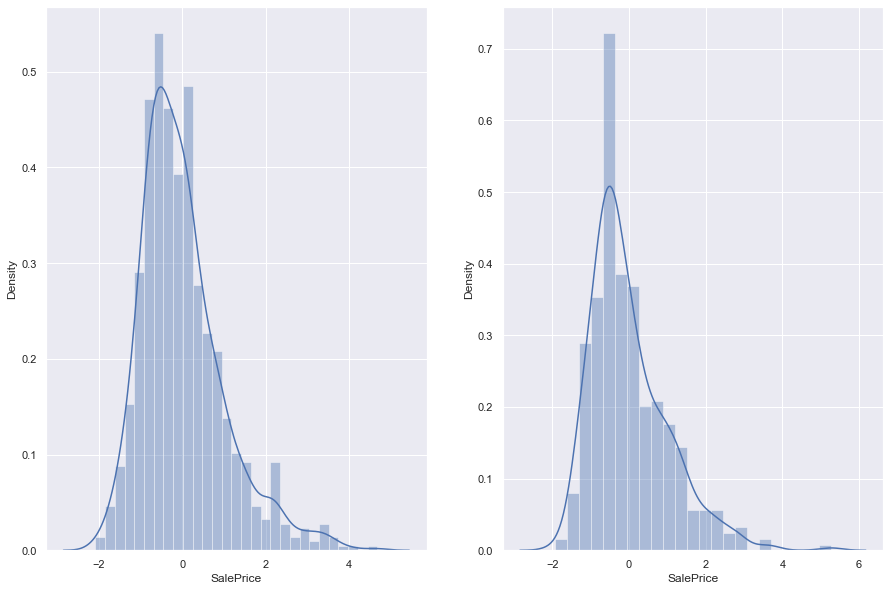

In [303]:
# Distribution of Target Variable
plt.figure(figsize = (15,10))
plt.subplot(121)
sns.distplot(y_train)
plt.subplot(122)
sns.distplot(y_test)

Both the distributions are a little right-skewed but not that significantly. 
I tried using log-transformation on target variable as that normall works on positive skewness, but that too did not make muc difference on the reults and hence removed that.

## STEP 3: Recursive feature elimination (RFE)
Number of indeppendent features used to predict: 
There were 176 columns and hence 175 features (as one of the column is for target variable). This is a lot of features and so come to a reasonale conclusion on number. So let us use RFE to get the best N features.

I have trained model with varied number of features, namely, N = 40, 50, 55, 60, 65, 70, 75 , 80, 90, 100, 110 to identif best option

Criteria used to zeroed down to best possible number of predictor variables: almost similar r2 score for test and train data ensuring there is no overfitting. Number cannot be too small also to avoid underfitting.

While results are improving from 40 to 110, the improvement in r2 score is not significant after N = 70

After going throght all results, I decided to go with N = 90 which gave r2 score of 0.93 and 0.88 respectively for train and test data for Ridge model, and 0.93 and 0.87 for Lasso, which looks pretty good.  

In [304]:
# Importing RFE and LinearRegression and Ridge and Lasso
from sklearn.feature_selection import RFE
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import LinearRegression, Ridge, Lasso
from sklearn.model_selection import GridSearchCV
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import r2_score,mean_squared_error

In [305]:
# Running RFE with the number of the features = 90

lm = LinearRegression()
lm.fit(X_train, y_train)

rfe = RFE(lm, n_features_to_select= 90)  # running RFE
rfe = rfe.fit(X_train, y_train)

list(zip(X_train.columns,rfe.support_,rfe.ranking_))

[('MSSubClass', False, 70),
 ('LotFrontage', False, 75),
 ('LotArea', False, 12),
 ('OverallQual', True, 1),
 ('OverallCond', True, 1),
 ('MasVnrArea', False, 26),
 ('BsmtFinSF1', True, 1),
 ('BsmtFinSF2', True, 1),
 ('BsmtUnfSF', True, 1),
 ('TotalBsmtSF', True, 1),
 ('1stFlrSF', True, 1),
 ('2ndFlrSF', True, 1),
 ('BsmtFullBath', False, 37),
 ('FullBath', False, 69),
 ('HalfBath', False, 78),
 ('BedroomAbvGr', False, 72),
 ('TotRmsAbvGrd', False, 61),
 ('Fireplaces', False, 50),
 ('GarageArea', True, 1),
 ('WoodDeckSF', False, 56),
 ('OpenPorchSF', False, 83),
 ('EnclosedPorch', False, 77),
 ('MoSold', False, 65),
 ('YrSold', False, 64),
 ('is_Remodelled', False, 81),
 ('house_age', False, 32),
 ('MSZoning_FV', True, 1),
 ('MSZoning_RH', False, 5),
 ('MSZoning_RL', True, 1),
 ('MSZoning_RM', True, 1),
 ('LotShape_IR2', False, 71),
 ('LotShape_IR3', False, 11),
 ('LotShape_Reg', False, 42),
 ('LandContour_HLS', False, 85),
 ('LandContour_Low', False, 21),
 ('LandContour_Lvl', False, 2

In [306]:
col = X_train.columns[rfe.support_]
print(col, "\nNumber of features = {}".format(len(col)))

Index(['OverallQual', 'OverallCond', 'BsmtFinSF1', 'BsmtFinSF2', 'BsmtUnfSF',
       'TotalBsmtSF', '1stFlrSF', '2ndFlrSF', 'GarageArea', 'MSZoning_FV',
       'MSZoning_RL', 'MSZoning_RM', 'LotConfig_CulDSac', 'LotConfig_FR3',
       'Neighborhood_Blueste', 'Neighborhood_BrDale', 'Neighborhood_BrkSide',
       'Neighborhood_ClearCr', 'Neighborhood_CollgCr', 'Neighborhood_Edwards',
       'Neighborhood_Gilbert', 'Neighborhood_IDOTRR', 'Neighborhood_MeadowV',
       'Neighborhood_Mitchel', 'Neighborhood_NAmes', 'Neighborhood_NPkVill',
       'Neighborhood_NWAmes', 'Neighborhood_NoRidge', 'Neighborhood_NridgHt',
       'Neighborhood_OldTown', 'Neighborhood_SWISU', 'Neighborhood_Sawyer',
       'Neighborhood_SawyerW', 'Neighborhood_StoneBr', 'Neighborhood_Timber',
       'Neighborhood_Veenker', 'Condition1_Norm', 'Condition1_PosA',
       'Condition1_PosN', 'Condition1_RRAe', 'BldgType_Duplex',
       'BldgType_Twnhs', 'BldgType_TwnhsE', 'HouseStyle_1.5Unf',
       'HouseStyle_2.5Fin', 'H

In [307]:
X_train.columns[~rfe.support_]

Index(['MSSubClass', 'LotFrontage', 'LotArea', 'MasVnrArea', 'BsmtFullBath',
       'FullBath', 'HalfBath', 'BedroomAbvGr', 'TotRmsAbvGrd', 'Fireplaces',
       'WoodDeckSF', 'OpenPorchSF', 'EnclosedPorch', 'MoSold', 'YrSold',
       'is_Remodelled', 'house_age', 'MSZoning_RH', 'LotShape_IR2',
       'LotShape_IR3', 'LotShape_Reg', 'LandContour_HLS', 'LandContour_Low',
       'LandContour_Lvl', 'LotConfig_FR2', 'LotConfig_Inside',
       'Neighborhood_Crawfor', 'Condition1_Feedr', 'Condition1_RRAn',
       'Condition1_RRNe', 'Condition1_RRNn', 'BldgType_2fmCon',
       'HouseStyle_1Story', 'HouseStyle_2Story', 'HouseStyle_SLvl',
       'RoofStyle_Gable', 'RoofStyle_Mansard', 'Exterior1st_BrkFace',
       'Exterior1st_CBlock', 'Exterior1st_HdBoard', 'Exterior1st_ImStucc',
       'Exterior1st_MetalSd', 'Exterior1st_Plywood', 'Exterior1st_Stone',
       'Exterior1st_Stucco', 'Exterior1st_VinylSd', 'Exterior1st_Wd Sdng',
       'Exterior1st_WdShing', 'Exterior2nd_BrkFace', 'Exterior2nd_ImS

In [308]:
# Creating X_train dataframe with RFE selected variables
X_train_rfe = X_train[col]
X_train_rfe

,OverallQual,OverallCond,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,GarageArea,MSZoning_FV,...,GarageQual_2.0,GarageQual_3.0,GarageQual_4.0,GarageQual_5.0,SaleType_CWD,SaleType_ConLD,SaleType_ConLw,SaleType_New,SaleType_Oth,SaleCondition_Normal
736,-2.321405,-1.502716,-0.995144,-0.291924,-1.346821,-2.749020,-0.283935,-0.778217,-0.333878,0,...,0,1,0,0,0,0,0,0,0,1
938,0.732123,-0.534299,0.128652,-0.291924,0.808409,0.952710,0.737950,0.613549,2.048596,0,...,0,1,0,0,0,0,0,1,0,0
1409,0.732123,0.434118,-0.995144,-0.291924,0.492216,-0.644011,0.286690,1.310650,0.389009,0,...,0,1,0,0,0,0,0,0,0,1
1009,-0.794641,-0.534299,-0.995144,-0.291924,0.996730,-0.066530,-0.377099,-0.778217,-2.370180,0,...,0,0,0,0,0,0,0,0,0,1
221,-0.031259,-0.534299,-0.995144,-0.291924,1.001380,-0.061208,-0.371276,2.285618,-0.384785,0,...,0,1,0,0,0,0,0,0,0,1
462,-0.794641,-0.534299,0.344207,1.827880,-1.346821,-0.449743,-0.796334,-0.778217,-0.537508,0,...,0,1,0,0,0,0,0,0,0,1
1067,-0.031259,0.434118,0.637266,0.430582,-1.346821,-0.673284,-0.988483,1.203404,-0.120066,0,...,0,1,0,0,0,0,0,0,0,1
1196,0.732123,-0.534299,-0.995144,-0.291924,0.696811,-0.409825,-0.752664,1.620202,0.989719,0,...,0,1,0,0,0,0,0,1,0,0
483,-0.031259,-0.534299,1.177366,-0.291924,-0.605161,0.487000,0.228463,-0.778217,-0.323696,0,...,0,1,0,0,0,0,0,0,0,1
564,0.732123,-0.534299,0.768053,-0.291924,-0.493564,0.164994,0.082895,1.973628,0.633366,0,...,0,1,0,0,0,0,0,0,0,1


In [309]:
# Creating X_test dataframe with RFE selected variables
X_test_rfe = X_test[col]
X_test_rfe

,OverallQual,OverallCond,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,GarageArea,MSZoning_FV,...,GarageQual_2.0,GarageQual_3.0,GarageQual_4.0,GarageQual_5.0,SaleType_CWD,SaleType_ConLD,SaleType_ConLw,SaleType_New,SaleType_Oth,SaleCondition_Normal
258,0.706961,-0.477989,-0.158017,-0.276668,0.105933,-0.143563,-0.473277,1.162822,0.443607,0,...,0,1,0,0,0,0,0,0,0,1
489,-1.556072,2.389943,0.231181,-0.276668,-0.976839,-0.992642,-1.424079,-0.828333,-0.857555,0,...,0,1,0,0,0,0,0,0,0,1
121,-1.556072,-0.477989,-1.070358,-0.276668,0.394969,-0.732564,-1.018632,0.014725,-0.960524,0,...,0,1,0,0,0,0,0,0,0,1
1444,0.706961,-0.477989,-1.070358,-0.276668,1.929081,1.026788,0.837287,-0.828333,0.733794,0,...,0,1,0,0,0,0,0,0,0,1
1137,-0.801728,2.389943,-1.070358,-0.276668,0.501690,-0.610174,-0.995790,-0.251883,-2.196160,0,...,0,0,0,0,0,0,0,0,0,1
486,-0.801728,1.433966,1.042431,-0.276668,-0.705590,0.136913,-0.159199,-0.828333,0.214265,0,...,0,1,0,0,0,0,0,0,0,1
325,-0.801728,0.477989,-0.777196,-0.276668,0.110380,-0.763161,-0.930119,-0.828333,-0.511202,0,...,0,1,0,0,0,0,0,0,0,1
40,-0.047383,-0.477989,0.554670,-0.276668,-0.243133,0.175160,0.557472,-0.828333,-0.136768,0,...,0,1,0,0,0,0,0,0,0,0
64,0.706961,-0.477989,0.797287,-0.276668,-0.525498,0.096117,-0.204883,1.518299,0.822722,0,...,0,1,0,0,0,0,0,0,0,1
107,-0.801728,-0.477989,-0.807523,0.852055,-0.085275,-0.587226,-0.970092,-0.828333,-1.026050,0,...,0,1,0,0,0,0,0,0,0,0


## APPROACH 1: SIMPLE LINEAR REGRESSION
### training this model only for the comparison purpose

In [310]:
import statsmodels.api as sm

# Add a constant
X_train_lm = sm.add_constant(X_train_rfe)
X_test_lm = sm.add_constant(X_test_rfe)


# Create a first fitted model
slr = sm.OLS(y_train, X_train_lm).fit()

In [311]:
# Check the parameters obtained

slr.params

const                  -8.265490e-01
OverallQual             1.390292e-01
OverallCond             8.184353e-02
BsmtFinSF1              1.108733e-01
BsmtFinSF2              2.622608e-02
BsmtUnfSF               1.590126e-02
TotalBsmtSF             1.502651e-01
1stFlrSF                2.330845e-01
2ndFlrSF                3.286632e-01
GarageArea              8.810272e-02
MSZoning_FV             1.988933e-01
MSZoning_RL             1.129495e-01
MSZoning_RM             1.255535e-01
LotConfig_CulDSac       1.236575e-01
LotConfig_FR3          -1.880254e-01
Neighborhood_Blueste   -3.977103e-01
Neighborhood_BrDale    -2.744639e-01
Neighborhood_BrkSide   -3.744250e-01
Neighborhood_ClearCr   -1.272219e-01
Neighborhood_CollgCr   -1.646902e-01
Neighborhood_Edwards   -4.393672e-01
Neighborhood_Gilbert   -1.598933e-01
Neighborhood_IDOTRR    -4.653567e-01
Neighborhood_MeadowV   -5.389210e-01
Neighborhood_Mitchel   -4.129433e-01
Neighborhood_NAmes     -3.952470e-01
Neighborhood_NPkVill   -2.100645e-01
N

In [312]:
# Print a summary of the linear regression model obtained
print(slr.summary())

                            OLS Regression Results                            
Dep. Variable:              SalePrice   R-squared:                       0.933
Model:                            OLS   Adj. R-squared:                  0.926
Method:                 Least Squares   F-statistic:                     134.9
Date:                Wed, 30 Nov 2022   Prob (F-statistic):               0.00
Time:                        20:25:32   Log-Likelihood:                -61.116
No. Observations:                 928   AIC:                             298.2
Df Residuals:                     840   BIC:                             723.5
Df Model:                          87                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                   -0.8265 

#### I am not checking VIF nor droping any features as I want to use same features for training that i will be using for Ridge and Lasso

In [313]:
# Making predictions on train set using the slr model

y_train_pred = slr.predict(X_train_lm)

In [314]:
# Making predictions on test set using the slr model

y_test_pred = slr.predict(X_test_lm)

In [315]:
# Computing other metrics that helps in evaluating model performance

slr_performance_metrics = []
r2_train_slr = r2_score(y_train, y_train_pred)
print("r2 score of training set = ", r2_train_slr)
slr_performance_metrics.append(r2_train_slr)

r2_test_slr = r2_score(y_test, y_test_pred)
print("r2 score of testing set = ", r2_test_slr)
slr_performance_metrics.append(r2_test_slr)

rss1_slr = np.sum(np.square(y_train - y_train_pred))
print("rss value of training set = ", rss1_slr)
slr_performance_metrics.append(rss1_slr)

rss2_slr = np.sum(np.square(y_test - y_test_pred))
print("rss value of testing set = ", rss2_slr)
slr_performance_metrics.append(rss2_slr)

mse_train_slr = mean_squared_error(y_train, y_train_pred)
print("MSE value of training set = ",mse_train_slr)
slr_performance_metrics.append(mse_train_slr)

mse_test_slr = mean_squared_error(y_test, y_test_pred)
print("MSE value of testing set = ", mse_test_slr)
slr_performance_metrics.append(mse_test_slr)

print(type(slr_performance_metrics))


r2 score of training set =  0.9332072703811691
r2 score of testing set =  0.8697830017177823
rss value of training set =  61.98365308627507
rss value of testing set =  51.826365316322594
MSE value of training set =  0.0667927296188309
MSE value of testing set =  0.13021699828221758
<class 'list'>


## APPROACH 2: RIDGE REGRESSION

In [316]:
# list of alphas to tune - if value too high it will lead to underfitting, 
# if it is too low, it will not handle the overfitting
# So with the help of Grid search, we will do the cross validation and identify best possible alpha value

params = {'alpha': [0.0001, 0.001, 0.01, 0.05, 0.1, 
 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0, 2.0, 3.0, 
 4.0, 5.0, 6.0, 7.0, 8.0, 9.0, 10.0, 20, 50, 100, 500, 1000 ]}

my_ridge = Ridge()

In [317]:
# cross validation with number of folds 5 & 10 were tried
# presenting 10 folds here as thhat gave better results than 5 folds

# folds = 5
folds = 10
ridge_model_cv = GridSearchCV(estimator = my_ridge, 
                        param_grid = params, 
                        scoring= 'neg_mean_absolute_error',  
                        cv = folds, 
                        return_train_score=True,
                        verbose = 1)            
ridge_model_cv.fit(X_train_rfe, y_train) 

Fitting 10 folds for each of 28 candidates, totalling 280 fits


GridSearchCV(cv=10, estimator=Ridge(),
             param_grid={'alpha': [0.0001, 0.001, 0.01, 0.05, 0.1, 0.2, 0.3,
                                   0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0, 2.0, 3.0,
                                   4.0, 5.0, 6.0, 7.0, 8.0, 9.0, 10.0, 20, 50,
                                   100, 500, 1000]},
             return_train_score=True, scoring='neg_mean_absolute_error',
             verbose=1)

In [318]:
# Printing the best hyperparameter alpha
print(ridge_model_cv.best_params_)

{'alpha': 2.0}


In [319]:
#Fitting Ridge model for specific alpha
#alpha = 1
my_ridge = Ridge(alpha = 2)

my_ridge.fit(X_train_rfe, y_train)
print(my_ridge.coef_)

[ 1.62275674e-01  8.52484765e-02  1.09412352e-01  2.65104698e-02
  1.13297464e-02  1.43538199e-01  2.39565148e-01  3.22680948e-01
  8.49110077e-02  2.45553898e-01  1.04459392e-01  3.56361617e-02
  1.27089729e-01 -1.15360025e-01 -8.22176609e-02 -9.80746635e-02
 -1.84114647e-01 -1.19645497e-02 -6.52260200e-02 -3.02150434e-01
 -6.24227958e-02 -2.69180481e-01 -2.70293412e-01 -2.83978253e-01
 -2.70849613e-01 -3.31319401e-05 -1.75136380e-01  3.45378973e-01
  2.39596241e-01 -3.63762741e-01 -2.92532566e-01 -2.15161324e-01
 -4.85024667e-02  1.66886347e-01 -9.98043686e-02 -2.39934193e-02
  1.45752081e-01  9.65878965e-02  1.53710027e-01 -1.45731995e-01
 -2.54322292e-01 -3.21610554e-01 -1.93177555e-01  7.12887004e-03
 -2.59469362e-01 -8.13460431e-02  2.70378187e-03 -9.48952774e-02
  0.00000000e+00 -1.60623536e-01  9.77275590e-02  1.05227088e-01
 -9.23277181e-02  6.80015793e-02  4.55472762e-02  1.74209022e-01
  2.32590181e-01 -2.22220819e-01 -1.28842728e-01  3.60526810e-01
 -1.46968869e-01  2.84676

In [320]:
cv_ridge_result = pd.DataFrame(ridge_model_cv.cv_results_)
cv_ridge_result['param_alpha'] = cv_ridge_result['param_alpha'].astype('float32')
cv_ridge_result.head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_alpha,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,...,split2_train_score,split3_train_score,split4_train_score,split5_train_score,split6_train_score,split7_train_score,split8_train_score,split9_train_score,mean_train_score,std_train_score
0,0.002793,0.000599,0.001695,0.000457,0.0001,{'alpha': 0.0001},-0.219177,-0.198767,-0.170597,-0.201640,...,-0.191167,-0.186696,-0.179831,-0.188402,-0.186930,-0.183951,-0.184546,-0.185715,-0.185876,0.002881
1,0.002996,0.001005,0.001897,0.000952,0.0010,{'alpha': 0.001},-0.219183,-0.198760,-0.170590,-0.201642,...,-0.191170,-0.186701,-0.179835,-0.188404,-0.186934,-0.183955,-0.184552,-0.185719,-0.185880,0.002880
2,0.004189,0.000747,0.002194,0.000399,0.0100,{'alpha': 0.01},-0.219240,-0.198692,-0.170524,-0.201657,...,-0.191201,-0.186749,-0.179875,-0.188424,-0.186969,-0.183988,-0.184606,-0.185765,-0.185919,0.002877
3,0.003191,0.001163,0.001695,0.000638,0.0500,{'alpha': 0.05},-0.219464,-0.198420,-0.170272,-0.201677,...,-0.191393,-0.186927,-0.180023,-0.188547,-0.187125,-0.184121,-0.184802,-0.185940,-0.186094,0.002884
4,0.002394,0.000489,0.001496,0.000499,0.1000,{'alpha': 0.1},-0.219706,-0.198127,-0.170029,-0.201678,...,-0.191621,-0.187148,-0.180167,-0.188938,-0.187366,-0.184369,-0.184980,-0.186160,-0.186336,0.002915


In [321]:
y_train_pred = my_ridge.predict(X_train_rfe)
print(r2_score(y_train,y_train_pred))
y_test_pred = my_ridge.predict(X_test_rfe)
print(r2_score(y_test,y_test_pred))

0.9308985907090128
0.8770869186773802


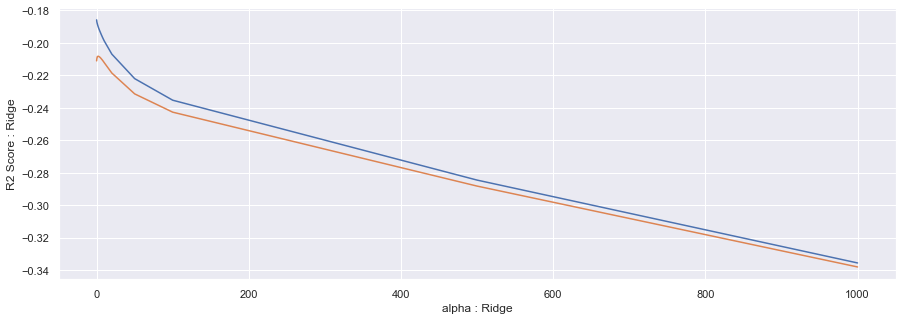

In [322]:
plt.figure(figsize=(15,5))
plt.plot(cv_ridge_result['param_alpha'],cv_ridge_result['mean_train_score'])
plt.plot(cv_ridge_result['param_alpha'],cv_ridge_result['mean_test_score'])
plt.xlabel('alpha : Ridge')
plt.ylabel('R2 Score : Ridge')
plt.show()

In [323]:
# Computing other metrics that helps in evaluating model performance
y_pred_train = my_ridge.predict(X_train_rfe)
y_pred_test = my_ridge.predict(X_test_rfe)

performance_metrics = []
r2_train_lr = r2_score(y_train, y_pred_train)
print("r2 score of training set = ", r2_train_lr)
performance_metrics.append(r2_train_lr)

r2_test_lr = r2_score(y_test, y_pred_test)
print("r2 score of testing set = ", r2_test_lr)
performance_metrics.append(r2_test_lr)

rss1_lr = np.sum(np.square(y_train - y_pred_train))
print("rss value of training set = ", rss1_lr)
performance_metrics.append(rss1_lr)

rss2_lr = np.sum(np.square(y_test - y_pred_test))
print("rss value of testing set = ", rss2_lr)
performance_metrics.append(rss2_lr)

mse_train_lr = mean_squared_error(y_train, y_pred_train)
print("MSE value of training set = ",mse_train_lr)
performance_metrics.append(mse_train_lr)

mse_test_lr = mean_squared_error(y_test, y_pred_test)
print("MSE value of testing set = ", mse_test_lr)
performance_metrics.append(mse_test_lr)


r2 score of training set =  0.9308985907090128
r2 score of testing set =  0.8770869186773802
rss value of training set =  64.12610782203615
rss value of testing set =  48.91940636640267
MSE value of training set =  0.06910140929098722
MSE value of testing set =  0.12291308132261977


In [326]:
ridge_parameter = list(my_ridge.coef_)
ridge_parameter.insert(0,my_ridge.intercept_)
cols = X_train_rfe.columns
cols.insert(0,'constant')
ridge_coef = pd.DataFrame(list(zip(cols,ridge_parameter)))
ridge_coef.columns = ['Ridge Feaure','Ridge Coef']

In [328]:
ridge_coef.sort_values(by='Ridge Coef',ascending=False).head(20)  # printing top 20 features

,Ridge Feaure,Ridge Coef
60,BsmtCond_2.0,0.360527
88,SaleType_Oth,0.355191
28,Neighborhood_NridgHt,0.345379
8,GarageArea,0.322681
72,FireplaceQu_5.0,0.290445
62,BsmtFinType1_GLQ,0.284677
65,BsmtFinType2_4.0,0.276520
10,MSZoning_RL,0.245554
29,Neighborhood_OldTown,0.239596
7,2ndFlrSF,0.239565


## Ridge Model Interpretation
From different variations that I tried (number of features = 40 to 110, num of folds = 5 & 10, scaling method = normalization & standardization, varied values of alpha), I learnt following:

    1. Scaling tecniques: Standardization scaling works better than min-max scaling. This might be because target variable distribution is not exxactly Gaussian, in fact it is a little right skewed. Standardization will scale all features such that mean = 0 and distribution is closer to Gaussian.
    
    2. number of indeppendent features used to predict: There were 176 columns and hence 175 features (as one of the column is for target variable). This is a lot of features and so come to a reasonale conclusion on number, I trained model with N = 40, 50, 55, 60, 65, 70, 75 , 80, 90, 100, 110.
       Criteria used to zeroed down to best possible number of predictor variables was to have almost similar r2 score for test and train data ensuring thhere is no overfitting. Number cannot be too small to avoid underfitting.
       While results were improving from 40 to 110, the improvement in r2 score was not significant after N = 70
       After going throght all results, I decided to go with N = 90 which gave r2 score of 0.93 and 0.88 respectively for train and test data, which looks pretty good.
       
    3. number of folds: tried withh 5 and 10 folds. We know that a higher number of folds means that each model is trained on a larger training set and tested on a smaller test fold. In theory, this should lead to a lower prediction error as the models see more of the available data. And thhat is exactl what I observed. Results with 10 fold were better than 5 folds and hence presented that in this code.    
    
    4. Most important features: higher coefficient value indicates more importaqnt is the feature as it contributes more in predicting the target variable. In the above training case, looking at the coefficient values, we can sa tat top 5 important features are (from higher to lower importance)
    
    -BsmtCond: Evaluates the general condition of the basement
    Condition of basement is cearly influencing the sale price in big way. This makes sense logically too, as basement area can be used as additional living space or for recreation activities or as a gym or simply as storage space which we never have enough
    
    -SaleType: Type of sale
    The feature is SaleType_Oth to be specific which indicates sale tpe as WD- Warranty Deed - Conventional. This shows that buyers prefer conventional warrant deeds over other sale types.
  
    -Neighborhood: Physical locations within Ames city limits
     The feature is Neighborhood_NridgHt to be specific which indicates Northridge Heights area. Earlier in EDA too we had seen that Northridge Heights neighborhood has high sale price and hence plays important role in predicting the sale price
    
    -GarageArea: Size of garage in square feet
    Quite logical choice, as garage area can be used not just for car parking but also as major storage place or like I mentioned in the case of basement, this too can be used for other recreational activities like music band, science lab for children etc.
    
    -FireplaceQu: Fireplace quality
    
    -BsmtFinType1: Rating of basement finished area
    -BsmtFinType2: Rating of basement finished area (if multiple types)
    -MSZoning: Identifies the general zoning classification of the sale 
    (the feature is MSZoning_RL to be specific which is RL - Residential Low Density)
     -Neighborhood: Physical locations within Ames city limits
     (the feature is Neighborhood_OldTown to be specific which indicates Old Town area)
     -2ndFlrSF: 2ndFlrSF: Second floor square feet


    5. Metrics that evaluates Model performance:
    
    r2 score of training set =  0.93
    r2 score of testing set =  0.88

    R-Squared (R² or the coefficient of determination) is a statistical measure in a regression model that determines the proportion of variance in the dependent variable that can be explained by the independent variable. In other words, r-squared shows how well the data fit the regression model (the goodness of fit). FRom the definition it is clear that higher it is , better fit is the model.

       In above model, r2 score for training as well as testing data set is close to each other indicating no overfitting of data. 
    Both values are pretty high too, indicating chosen independent variables and trained coefficients fits well to data and hence as hhigh prediction power

    rss value of training set =  64.12
    rss value of testing set =  48.92
    
    The residual sum of squares (RSS) measures the level of variance in the error term, or residuals, of a regression model. The smaller the residual sum of squares, the better your model fits your data; the greater the residual sum of squares, the poorer your model fits your data.
    
    Considering this is sum of square of errors, 64.12 and 48.92 are quite small values indicating good fit. 
    
    MSE value of training set =  0.07
    MSE value of testing set =  0.12
    
    The Mean Squared Error measures how close a regression line is to a set of data points. It is a risk function corresponding to the expected value of the squared error loss. Mean square error is calculated by taking the average, specifically the mean, of errors squared from data as it relates to a function.
    
    Once again 0.07 and 012 are prett low values for MSE, reinstating that we have a good model here.

## APPROACH 3: LASSO REGRESSION 

In [329]:
# list of alphas to tune - if value too high it will lead to underfitting, if it is too low, 
# it will not handle the overfitting
# So with the help of Grid search, we will do the cross validation and identify best possible alpha value

params = {'alpha': [0.0001, 0.001, 0.01, 0.05, 0.1, 
 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0, 2.0, 3.0, 
 4.0, 5.0, 6.0, 7.0, 8.0, 9.0, 10.0, 20, 50, 100, 500, 1000 ]}

my_lasso = Lasso()

In [330]:
# cross validation using Grid Search

folds = 5
#folds = 10

lasso_model_cv = GridSearchCV(estimator = my_lasso, 
                        param_grid = params, 
                        scoring= 'neg_mean_absolute_error', 
                        cv = folds, 
                        return_train_score=True,
                        verbose = 1)            

lasso_model_cv.fit(X_train_rfe, y_train) 

Fitting 5 folds for each of 28 candidates, totalling 140 fits


GridSearchCV(cv=5, estimator=Lasso(),
             param_grid={'alpha': [0.0001, 0.001, 0.01, 0.05, 0.1, 0.2, 0.3,
                                   0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0, 2.0, 3.0,
                                   4.0, 5.0, 6.0, 7.0, 8.0, 9.0, 10.0, 20, 50,
                                   100, 500, 1000]},
             return_train_score=True, scoring='neg_mean_absolute_error',
             verbose=1)

In [331]:
# Printing the best hyperparameter alpha
print(lasso_model_cv.best_params_)

{'alpha': 0.0001}


In [332]:
#Fitting lasso model for specific alpha value 
#alpha = 0.0001

my_lasso = Lasso(alpha = 0.0001)
        
my_lasso.fit(X_train_rfe, y_train) 

Lasso(alpha=0.0001)

In [333]:
my_lasso.coef_  # coefficients which have been penalised

array([ 0.14583348,  0.08451833,  0.09593436,  0.02160455, -0.        ,
        0.15928625,  0.23607616,  0.32588673,  0.08491543,  0.21455671,
        0.10012069,  0.09262468,  0.12413512, -0.1637289 , -0.25181192,
       -0.20997274, -0.3169374 , -0.08018081, -0.12703632, -0.39542915,
       -0.1225207 , -0.41741383, -0.45903972, -0.37240732, -0.35256951,
       -0.05629001, -0.2507285 ,  0.33083716,  0.21476067, -0.5007706 ,
       -0.40627204, -0.30193203, -0.10731139,  0.15791624, -0.14892345,
       -0.07822486,  0.14860099,  0.1413233 ,  0.18149341, -0.1744207 ,
       -0.29176333, -0.37901185, -0.2282406 ,  0.00370869, -0.43268961,
       -0.11977464,  0.0162969 , -0.1302795 ,  0.        , -0.4775711 ,
        0.11187575,  0.25897292, -0.        ,  0.0958327 ,  0.07395723,
        0.20092007,  0.23950985, -0.39130874, -0.19543141,  0.36624468,
       -0.15146409,  0.29224143,  0.10817225, -0.15546331,  0.30496844,
       -0.15982012,  0.14369541,  0.        , -0.02722445, -0.  

In [334]:
y_lasso_train_pred = my_lasso.predict(X_train_rfe)
print(r2_score(y_train,y_lasso_train_pred))
y_lasso_test_pred = my_lasso.predict(X_test_rfe)
print(r2_score(y_test,y_lasso_test_pred))

0.932803772843068
0.8727169991390559


In [335]:
cv_lasso_result= pd.DataFrame(lasso_model_cv.cv_results_)
cv_lasso_result['param_alpha'] = cv_lasso_result['param_alpha'].astype('float32')
cv_lasso_result.head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_alpha,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,...,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,0.030526,2.877166e-03,0.001998,6.652519e-06,0.0001,{'alpha': 0.0001},-0.215840,-0.187022,-0.220781,-0.213578,...,-0.210690,0.012063,1,-0.185942,-0.192632,-0.183167,-0.185560,-0.184469,-0.186354,0.003284
1,0.004986,2.780415e-07,0.000998,3.015783e-07,0.0010,{'alpha': 0.001},-0.214008,-0.190344,-0.219264,-0.212820,...,-0.211728,0.011227,2,-0.194401,-0.199981,-0.191118,-0.194699,-0.192455,-0.194531,0.003023
2,0.003798,9.869978e-04,0.002393,1.017439e-03,0.0100,{'alpha': 0.01},-0.238679,-0.235690,-0.266781,-0.245758,...,-0.251082,0.013921,3,-0.244596,-0.247959,-0.238483,-0.243838,-0.241205,-0.243216,0.003201
3,0.002992,5.352484e-07,0.001596,4.883441e-04,0.0500,{'alpha': 0.05},-0.277528,-0.289442,-0.335230,-0.289377,...,-0.302623,0.021908,4,-0.302418,-0.307007,-0.292771,-0.300100,-0.296833,-0.299826,0.004839
4,0.002793,3.989936e-04,0.001197,3.989936e-04,0.1000,{'alpha': 0.1},-0.295319,-0.318055,-0.362219,-0.307730,...,-0.323601,0.023224,5,-0.322003,-0.329775,-0.317222,-0.320642,-0.318049,-0.321538,0.004465


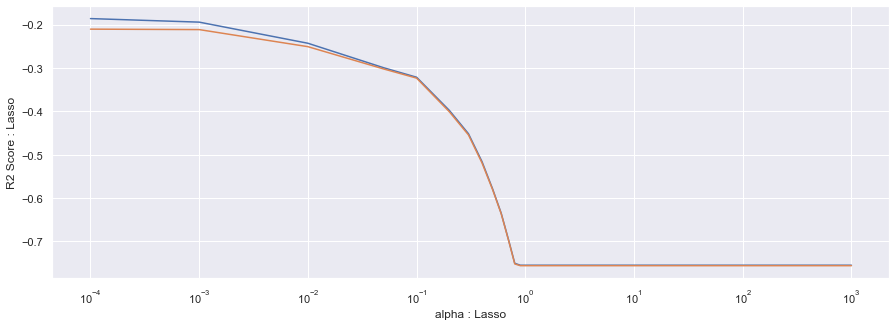

In [336]:
plt.figure(figsize=(15,5))
plt.plot(cv_lasso_result['param_alpha'],cv_lasso_result['mean_train_score'])
plt.plot(cv_lasso_result['param_alpha'],cv_lasso_result['mean_test_score'])
plt.xlabel('alpha : Lasso')
plt.xscale('log')
plt.ylabel('R2 Score : Lasso')
plt.show()

In [337]:
# Computing other metrics that helps in evaluating model performance
y_lasso_train_pred = my_lasso.predict(X_train_rfe)
y_lasso_test_pred = my_lasso.predict(X_test_rfe)

performance_metrics_lasso = []
r2_train_lasso = r2_score(y_train, y_lasso_train_pred)
print("r2 score of training set = ", r2_train_lasso)
performance_metrics_lasso.append(r2_train_lasso)

r2_test_lasso = r2_score(y_test, y_lasso_test_pred)
print("r2 score of testing set = ", r2_test_lasso)
performance_metrics_lasso.append(r2_test_lasso)

rss1_lasso = np.sum(np.square(y_train - y_lasso_train_pred))
print("rss value of training set = ", rss1_lasso)
performance_metrics_lasso.append(rss1_lasso)

rss2_lasso = np.sum(np.square(y_test - y_lasso_test_pred))
print("rss value of testing set = ", rss2_lasso)
performance_metrics_lasso.append(rss2_lasso)

mse_train_lasso = mean_squared_error(y_train, y_lasso_train_pred)
print("MSE value of training set = ", mse_train_lasso)
performance_metrics_lasso.append(mse_train_lasso)

mse_test_lasso = mean_squared_error(y_test, y_lasso_test_pred)
print("MSE value of testing set = ", mse_test_lasso)
performance_metrics_lasso.append(mse_test_lasso)


r2 score of training set =  0.932803772843068
r2 score of testing set =  0.8727169991390559
rss value of training set =  62.35809880163284
rss value of testing set =  50.65863434265574
MSE value of training set =  0.06719622715693194
MSE value of testing set =  0.12728300086094407


In [338]:
lasso_parameter = list(my_lasso.coef_)
lasso_parameter.insert(0,my_lasso.intercept_)
cols = X_train_rfe.columns
cols.insert(0,'constant')
lasso_coef = pd.DataFrame(list(zip(cols,lasso_parameter)))
lasso_coef.columns = ['Lasso Feaure','Lasso Coef']

In [339]:
lasso_coef.sort_values(by='Lasso Coef',ascending=False).head(20)

,Lasso Feaure,Lasso Coef
60,BsmtCond_2.0,0.366245
88,SaleType_Oth,0.345030
28,Neighborhood_NridgHt,0.330837
76,GarageType_CarPort,0.329764
79,GarageFinish_3.0,0.326146
8,GarageArea,0.325887
72,FireplaceQu_5.0,0.305693
65,BsmtFinType2_4.0,0.304968
62,BsmtFinType1_GLQ,0.292241
85,SaleType_ConLD,0.289436


## Lasso Model Interpretation
From different variations that I tried (number of features = 40 to 110, num of folds = 5 & 10, scaling method = normalization & standardization, varied values of alpa), I learnt following:

    1. Scaling tecniques: Standardization scaling works better than min-max scaling. This might be because target variable distribution is not exxactly Gaussian, in fact it is a little right skewed. Standardization will scale all features such that mean = 0 and distribution is closer to Gaussian.
    
    2. number of indeppendent features used to predict: There were 176 columns and hence 175 features (as one of the column is for target variable). This is a lot of features and so come to a reasonale conclusion on number, I trained model with N = 40, 50, 55, 60, 65, 70, 75 , 80, 90, 100, 110.
       Criteria used to zeroed down to best possible number of predictor variables was to have almost similar r2 score for test and train data ensuring thhere is no overfitting. Number cannot be too small to avoid underfitting.
       While results were improving from 40 to 110, the improvement in r2 score was not significant after N = 70
       After going throght all results, I decided to go with N = 90 which gave r2 score of 0.93 and 0.87 respectively for train and test data, which looks pretty good.
       
    3. number of folds: tried withh 5 and 10 folds. We know that a higher number of folds means that each model is trained on a larger training set and tested on a smaller test fold. In theory, this should lead to a lower prediction error as the models see more of the available data. However, in this case, results with 5 folds were better than a0 folds and hence presented that in this code. 
    
    evaluation parameters for 5 folds
    r2 score of training set =  0.932803772843068
    r2 score of testing set =  0.8727169991390559
    rss value of training set =  62.35809880163284
    rss value of testing set =  50.65863434265574
    MSE value of training set =  0.06719622715693194
    MSE value of testing set =  0.12728300086094407
    
    evaluation parameters for 10 folds
    r2 score of training set =  0.9261924229794842
    r2 score of testing set =  0.8800880919309105
    rss value of training set =  68.49343147503859
    rss value of testing set =  47.724939411497594
    MSE value of training set =  0.07380757702051573
    MSE value of testing set =  0.11991190806908943

    
    4. Most important features: higher coefficient value indicates more importaqnt is the feature as it contributes more in predicting the target variable. In the above training case, looking at the coefficient values, we can say that top 5 important features are (from higher to lower importance)
    
    -BsmtCond : Evaluates the general condition of the basement 
    BsmtCond_2.0 to be precise: Fa	Fair - dampness or some cracking or settling
    
    -SaleType : Type of sale - other
    SaleType_Oth to be precise which means other
    
    -Neighborhood : Physical locations within Ames city limits
    Neighborhood_NridgHt to be precise which is  Northridge Heights area, a premium locality
    
    -GarageType : Garage location  
    GarageType_CarPort to be precise which means Car Port 
    
    -GarageFinish : Interior finish of the garage
    GarageFinish_3.0 to be precise which means Finished
    
    5. Metrics that evaluates Model performance:
    
    r2 score of training set =  0.93
    r2 score of testing set =  0.87

    R-Squared (R² or the coefficient of determination) is a statistical measure in a regression model that determines the proportion of variance in the dependent variable that can be explained by the independent variable. In other words, r-squared shows how well the data fit the regression model (the goodness of fit). FRom the definition it is clear that higher it is , better fit is the model.

       In above model, r2 score for training as well as testing data set is close to each other indicating no overfitting of data. 
    Both values are pretty high too, indicating chosen independent variables and trained coefficients fits well to data and hence as hhigh prediction power

    rss value of training set =  62.36
    rss value of testing set =  50.66
        
    The residual sum of squares (RSS) measures the level of variance in the error term, or residuals, of a regression model. The smaller the residual sum of squares, the better your model fits your data; the greater the residual sum of squares, the poorer your model fits your data.
    
    Considering this is sum of square of errors, 62.36 and 50.66 are quite small values indicating good fit.
    
    MSE value of training set =  0.07
    MSE value of testing set =  0.12
    

    The Mean Squared Error measures how close a regression line is to a set of data points. It is a risk function corresponding to the expected value of the squared error loss. Mean square error is calculated by taking the average, specifically the mean, of errors squared from data as it relates to a function.
    
    Once again 0.07 and 0.12 are prett low values for MSE, reinstating that we have a good model here.

## Model Comparison (Simple LR, Ridge and Lasso)

In [340]:
# Creating a table which contain all the performance evaluating metrics for all three models for comparison purpose

compare_model_metric = pd.DataFrame({'Metric': ['R2 Score (Train)','R2 Score (Test)','RSS (Train)','RSS (Test)','MSE (Train)','MSE (Test)'] , 'Simple Linear Regression': slr_performance_metrics,'Ridge Regression': performance_metrics, 'Lasso Regression': performance_metrics_lasso})

compare_model_metric

,Metric,Simple Linear Regression,Ridge Regression,Lasso Regression
0,R2 Score (Train),0.933207,0.930899,0.932804
1,R2 Score (Test),0.869783,0.877087,0.872717
2,RSS (Train),61.983653,64.126108,62.358099
3,RSS (Test),51.826365,48.919406,50.658634
4,MSE (Train),0.066793,0.069101,0.067196
5,MSE (Test),0.130217,0.122913,0.127283


### Lets look at how different are  the coefficients after regularization

In [341]:
coefficients = pd.DataFrame(index = X_train_rfe.columns)

In [342]:
coefficients['Simpple Linear'] = slr.params
coefficients['Ridge'] = my_ridge.coef_
coefficients['Lasso'] = my_lasso.coef_

In [343]:
pd.set_option('display.max_rows', None)
coefficients.head(90)

,Simpple Linear,Ridge,Lasso
OverallQual,1.390292e-01,0.162276,0.145833
OverallCond,8.184353e-02,0.085248,0.084518
BsmtFinSF1,1.108733e-01,0.109412,0.095934
BsmtFinSF2,2.622608e-02,0.026510,0.021605
BsmtUnfSF,1.590126e-02,0.011330,-0.000000
TotalBsmtSF,1.502651e-01,0.143538,0.159286
1stFlrSF,2.330845e-01,0.239565,0.236076
2ndFlrSF,3.286632e-01,0.322681,0.325887
GarageArea,8.810272e-02,0.084911,0.084915
MSZoning_FV,1.988933e-01,0.245554,0.214557


## Comparing three models

1. If we look at thhe performance metrics, there is no major difference between three models and one may think wh not use Simple Linear Regression

2. However, what is interesting is the coefficient values:
If you look closely, Lasso has 7 features with coefficient value = 0

So Lasso has manged to reduce 7  variables' coefficients to zero and hence managed to eliminate 7 features wich are irrelevant, namely - BsmtUnfSF , Exterior1st_AsphShn ,  Exterior2nd_Brk Cmn	,  HeatingQC_1 , HeatingQC_3 , GarageQual_2.0 , GarageQual_5.0 
    
While Ridge and simple LR retained those variables may be with smaller coefficient values.

This shows that Lasso managed to get same performance with less number of features by eliminating irrelevant features and hence it is a simpler model, with lesset features giving same performance on given training / testing data.

When we have two (or three) competing models that fit the data equally well, Occam's razor recommends to 'shave away all but what is necessary'. The concept of parsimony is based on Occam's razor, which also proposes that the model with fewer parameters to be preferred to the one with more. Which means Lasso is the best option out of the three models.



## Question 1

What is the optimal value of alpha for ridge and lasso regression? What will be the changes in the model if you choose double the value of alpha for both ridge and lasso? What will be the most important predictor variables after the change is implemented?

### Answer 1:

In [344]:
print("optimal value for ridge = ", ridge_model_cv.best_params_)
print("optimal value for lasso regression = ", lasso_model_cv.best_params_)

optimal value for ridge =  {'alpha': 2.0}
optimal value for lasso regression =  {'alpha': 0.0001}


### Changing the alpha to double the optimal value

### For Ridge

In [345]:
#Fitting Ridge model for specific alpha
#alpha = 4
my_ridge = Ridge(alpha = 4)

my_ridge.fit(X_train_rfe, y_train)

Ridge(alpha=4)

In [346]:
# Computing other metrics that helps in evaluating model performance
y_pred_train = my_ridge.predict(X_train_rfe)
y_pred_test = my_ridge.predict(X_test_rfe)

performance_metrics = []
r2_train_lr = r2_score(y_train, y_pred_train)
print("r2 score of training set = ", r2_train_lr)
performance_metrics.append(r2_train_lr)

r2_test_lr = r2_score(y_test, y_pred_test)
print("r2 score of testing set = ", r2_test_lr)
performance_metrics.append(r2_test_lr)

rss1_lr = np.sum(np.square(y_train - y_pred_train))
print("rss value of training set = ", rss1_lr)
performance_metrics.append(rss1_lr)

rss2_lr = np.sum(np.square(y_test - y_pred_test))
print("rss value of testing set = ", rss2_lr)
performance_metrics.append(rss2_lr)

mse_train_lr = mean_squared_error(y_train, y_pred_train)
print("MSE value of training set = ",mse_train_lr)
performance_metrics.append(mse_train_lr)

mse_test_lr = mean_squared_error(y_test, y_pred_test)
print("MSE value of testing set = ", mse_test_lr)
performance_metrics.append(mse_test_lr)

r2 score of training set =  0.9288958161770768
r2 score of testing set =  0.8786257248588143
rss value of training set =  65.98468258767265
rss value of testing set =  48.3069615061919
MSE value of training set =  0.07110418382292312
MSE value of testing set =  0.12137427514118566


In [347]:
ridge_parameter = list(my_ridge.coef_)
ridge_parameter.insert(0,my_ridge.intercept_)
cols = X_train_rfe.columns
cols.insert(0,'constant')
ridge_coef = pd.DataFrame(list(zip(cols,ridge_parameter)))
ridge_coef.columns = ['Ridge Feaure','Ridge Coef (for double alpha)']

ridge_coef.sort_values(by='Ridge Coef (for double alpha)',ascending=False).head(20)  # printing top 5 features

,Ridge Feaure,Ridge Coef (for double alpha)
60,BsmtCond_2.0,0.354604
88,SaleType_Oth,0.351172
28,Neighborhood_NridgHt,0.326954
8,GarageArea,0.320854
72,FireplaceQu_5.0,0.279091
62,BsmtFinType1_GLQ,0.275258
65,BsmtFinType2_4.0,0.247357
7,2ndFlrSF,0.241600
29,Neighborhood_OldTown,0.237931
10,MSZoning_RL,0.231263


#### For Optimal alpha value, we obtained following:
    r2 score of training set =  0.9308985907090128
    r2 score of testing set =  0.8770869186773802
    rss value of training set =  64.12610782203615
    rss value of testing set =  48.91940636640267
    MSE value of training set =  0.06910140929098722
    MSE value of testing set =  0.12291308132261977   
    
#### Ater doubling the alpha we obtained:
    r2 score of training set =  0.9288958161770768
    r2 score of testing set =  0.8786257248588143
    rss value of training set =  65.98468258767265
    rss value of testing set =  48.3069615061919
    MSE value of training set =  0.07110418382292312
    MSE value of testing set =  0.12137427514118566
    
    
#### Top 5 features for otimal alpha
    BsmtCond_2.0	0.360527
    SaleType_Oth	0.355191
    Neighborhood_NridgHt	0.345379
    GarageArea	0.322681
    FireplaceQu_5.0	0.290445


#### Top 5 features for doubling alpha
         BsmtCond_2.0	0.354604
        SaleType_Oth	0.351172
    Neighborhood_NridgHt	0.326954
            GarageArea	0.320854
       FireplaceQu_5.0	0.279091

### Deduction on effect of douling alpha value for  Ridge model
    Evaluation parameters:
    1. r2 score for train data reduced by approximately 0.002 while it increased for test data by 0.001 approximately
    2. rss increased for test data by 1.8 but reduced for test data by 0.6 approximately
    3. MSE increased for test data by 0.002 but reduced for test data by 0.0016 approximately
    
    Top features:
    4. When we double the alpha from optimal values, we observe following:
    •	Top 7 features remain the same
    •	8th and 10th feature got swapped, wile 9th remained the same
    •	What is interesting is 19 out of 20 features are same in both(at different rank), onl the 20th feature in both is different
    •	the most important feature, 'BsmtCond_2.0', is same in both. However its  coefficient value is reduced from 0.36 to 0.35 , making it a little less significant


### For Lasso

In [348]:
#Fitting lasso model for specific alpha value 
#alpha = 0.0002

my_lasso = Lasso(alpha = 0.0002)   
my_lasso.fit(X_train_rfe, y_train) 

Lasso(alpha=0.0002)

In [349]:
# Computing other metrics that helps in evaluating model performance
y_lasso_train_pred = my_lasso.predict(X_train_rfe)
y_lasso_test_pred = my_lasso.predict(X_test_rfe)

performance_metrics_lasso = []
r2_train_lasso = r2_score(y_train, y_lasso_train_pred)
print("r2 score of training set = ", r2_train_lasso)
performance_metrics_lasso.append(r2_train_lasso)

r2_test_lasso = r2_score(y_test, y_lasso_test_pred)
print("r2 score of testing set = ", r2_test_lasso)
performance_metrics_lasso.append(r2_test_lasso)

rss1_lasso = np.sum(np.square(y_train - y_lasso_train_pred))
print("rss value of training set = ", rss1_lasso)
performance_metrics_lasso.append(rss1_lasso)

rss2_lasso = np.sum(np.square(y_test - y_lasso_test_pred))
print("rss value of testing set = ", rss2_lasso)
performance_metrics_lasso.append(rss2_lasso)

mse_train_lasso = mean_squared_error(y_train, y_lasso_train_pred)
print("MSE value of training set = ", mse_train_lasso)
performance_metrics_lasso.append(mse_train_lasso)

mse_test_lasso = mean_squared_error(y_test, y_lasso_test_pred)
print("MSE value of testing set = ", mse_test_lasso)
performance_metrics_lasso.append(mse_test_lasso)


r2 score of training set =  0.9321748451628569
r2 score of testing set =  0.8749575913020693
rss value of training set =  62.94174368886878
rss value of testing set =  49.76687866177642
MSE value of training set =  0.06782515483714309
MSE value of testing set =  0.1250424086979307


In [352]:
lasso_parameter = list(my_lasso.coef_)
lasso_parameter.insert(0,my_lasso.intercept_)
cols = X_train_rfe.columns
cols.insert(0,'constant')
lasso_coef = pd.DataFrame(list(zip(cols,lasso_parameter)))
lasso_coef.columns = ['Lasso Feaure','Lasso Coef (for double alpha)']
lasso_coef.sort_values(by='Lasso Coef (for double alpha)',ascending=False).head(20) # printing top 5 features

,Lasso Feaure,Lasso Coef (for double alpha)
60,BsmtCond_2.0,0.368186
28,Neighborhood_NridgHt,0.356684
88,SaleType_Oth,0.352525
8,GarageArea,0.323802
72,FireplaceQu_5.0,0.302482
65,BsmtFinType2_4.0,0.298335
62,BsmtFinType1_GLQ,0.291491
76,GarageType_CarPort,0.265161
85,SaleType_ConLD,0.260242
7,2ndFlrSF,0.237516


#### For Optimal alpha value, we obtained following:
    r2 score of training set =  0.932803772843068
    r2 score of testing set =  0.8727169991390559
    rss value of training set =  62.35809880163284
    rss value of testing set =  50.65863434265574
    MSE value of training set =  0.06719622715693194
    MSE value of testing set =  0.12728300086094407  
    
#### After doubling the alpha we obtained:
    r2 score of training set =  0.9321748451628569
    r2 score of testing set =  0.8749575913020693
    rss value of training set =  62.94174368886878
    rss value of testing set =  49.76687866177642
    MSE value of training set =  0.06782515483714309
    MSE value of testing set =  0.1250424086979307    
    
#### Top 5 features for otimal alpha
           BsmtCond_2.0	0.366245
        SaleType_Oth	0.345030
    Neighborhood_NridgHt	0.330837
    GarageType_CarPort	0.329764
    GarageFinish_3.0	0.326146


#### Top 5 features for doubling alpha
        BsmtCond_2.0	0.368186
    Neighborhood_NridgHt	0.356684
        SaleType_Oth	0.352525
            GarageArea	0.323802
        FireplaceQu_5.0	0.302482
    
### Deduction on effect of doubling alpha value for  Lasso model
    Evaluation parameters:
    1. r2 score for train data reduced by approximately 0.0007 while it increased for test data byy 0.0022 approxximately
    2. rss increased for test data by 0.59 but reduced for test data by 0.89 approximately
    3. MSE increased for test data by 0.0007 but reduced for test data by 0.002 approximately
    
    Top features:
    4. While the most important feature is still BsmtCond_2. 0 (with a little higher coefficient value), there is some changes in other top features when we double the alpha from optimal value:
    •	Most important feature BsmtCond_2.0  coefficient value has increased a little from 0.366245	to 0.368186
    •	Neighborhood_NridgHt which was 3rd from top as now gone up to 2nd position
    •	 SaleType_Oth moved down, from 2nd to 3rd position
    •	GarageType_CarPort and GarageFinish_3.0 which were on 4th and 5th position, is now replaced by GarageArea and FireplaceQu_5.0
    •	14 out of 20 features are same in both(at different rank),  but 6 new features have replaced the original selection


## Question 2

You have determined the optimal value of lambda for ridge and lasso regression during the assignment. Now, which one will you choose to apply and why?

In [213]:
coefficients.head(90)

,Simpple Linear,Ridge,Lasso
OverallQual,1.390292e-01,0.162276,0.145833
OverallCond,8.184353e-02,0.085248,0.084518
BsmtFinSF1,1.108733e-01,0.109412,0.095934
BsmtFinSF2,2.622608e-02,0.026510,0.021605
BsmtUnfSF,1.590126e-02,0.011330,-0.000000
TotalBsmtSF,1.502651e-01,0.143538,0.159286
1stFlrSF,2.330845e-01,0.239565,0.236076
2ndFlrSF,3.286632e-01,0.322681,0.325887
GarageArea,8.810272e-02,0.084911,0.084915
MSZoning_FV,1.988933e-01,0.245554,0.214557


## Answer 2: 

Ridge regression and Lasso regression are two popular techniques that make use of regularization for predicting.

Both the techniques work by penalizing the magnitude of coefficients of features along with minimizing the error between predictions and actual values or records.

The key difference however, between Ridge and Lasso regression is that Lasso Regression has the ability to nullify the impact of an irrelevant feature in the data, by reducing the coefficient of a feature to zero thus completely eliminating it and hence is better at reducing the variance when the data consists of many insignificant features. 

Ridge regression, on the other hand, can not reduce the coefficients to absolute zero. However, it performs better when the data consists of features which are sure to be more relevant and useful.

Mathematically, 
Lasso is = Residual Sum of Squares + λ * (Sum of the absolute value of the magnitude of coefficients)

whereas

Ridge is = Residual Sum of Squares + λ * (Sum of the square value of the magnitude of coefficients)

Which makes Ridge mathematicall more expensive.



I will go for Lasso regression in spite of the fact that the metric values are not ver different for Ridge and Lasso (and even simple LR) for the following reasons:

    1. We have a huge bank of features and there are many features that does not look that strongly related to target (evident from heatmap and correlation values). This is exactly the scenario where Lasso is useful.
    
    Look at the coefficients displayed above for simple LR, Ridge and Lasso, what ou will notice is Lasso has managed to reduce 7  variables' coefficients to zero and hence managed to eliminate 7 features that is irrelevant, namely - BsmtUnfSF, Exterior1st_AsphShn,  Exterior2nd_Brk Cmn,  HeatingQC_1, HeatingQC_3 , GarageQual_2.0, GarageQual_5.0 
    
    This shows that Lasso managed to get same performance with less number of features by eliminating irrelevant features and hence it is a simpler model, with lesset features giving same performance on given training / testing data.

    When we have two (or three) competing models that fit the data equally well, Occam's razor recommends to 'shave away all but what is necessary'. The concept of parsimony is based on Occam's razor, which also proposes that the model with fewer parameters to be preferred to the one with more. Which means Lasso is the best option out of the three models.
 
    While Ridge and simple LR retained those variables may be with smaller coefficient values.
       
    
    2. Mathematically, Lasso is less expensive as mentioned earlier
    
    

## Question 3

After building the model, you realised that the five most important predictor variables in the lasso model are not available in the incoming data. You will now have to create another model excluding the five most important predictor variables. Which are the five most important predictor variables now?

###  Most important  5 features in Lasso currently are as follows (from higher to lower importance)

    -BsmtCond (BsmtCond_2.0 to be precise) : Evaluates the general condition of the basement
    -SaleType (SaleType_Oth to be precise) : Type of sale
    -Neighborhood (Neighborhood_NridgHt to be precise) : Physical locations within Ames city limits
    -GarageType (GarageType_CarPort to be precise)  : Garage location
    -GarageFinish (GarageFinish_3.0 to be precise): Interior finish of the garage
        
 Removing all above 5 features and trainin the model again.

In [353]:
X_train.columns

Index(['MSSubClass', 'LotFrontage', 'LotArea', 'OverallQual', 'OverallCond',
       'MasVnrArea', 'BsmtFinSF1', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF',
       ...
       'SaleType_ConLD', 'SaleType_ConLI', 'SaleType_ConLw', 'SaleType_New',
       'SaleType_Oth', 'SaleType_WD', 'SaleCondition_AdjLand',
       'SaleCondition_Alloca', 'SaleCondition_Family', 'SaleCondition_Normal'],
      dtype='object', length=175)

In [354]:
X_train_new = X_train.copy() # making a copy in case needed

X_train_new.drop(['BsmtCond_2.0', 'SaleType_Oth', 'Neighborhood_NridgHt', 'GarageType_CarPort', 'GarageFinish_3.0'], axis='columns', inplace=True)

In [358]:
X_test_new = X_test.copy() # making a copy in case needed

X_test_new.drop(['BsmtCond_2.0', 'SaleType_Oth', 'Neighborhood_NridgHt', 'GarageType_CarPort', 'GarageFinish_3.0'], axis='columns', inplace=True)

In [355]:
# Running RFE with the number of the features = 90

lm = LinearRegression()
lm.fit(X_train_new, y_train)

rfe = RFE(lm, n_features_to_select= 90)  # running RFE
rfe = rfe.fit(X_train_new, y_train)


In [356]:
col = X_train_new.columns[rfe.support_]
#X_train_new.columns[~rfe.support_]

In [357]:
# Creating X_train dataframe with RFE selected variables
X_train_rfe = X_train_new[col]
#X_train_rfe

In [359]:
# Creating X_train dataframe with RFE selected variables
X_test_rfe = X_test_new[col]
#X_test_rfe

In [360]:
params = {'alpha': [0.0001, 0.001, 0.01, 0.05, 0.1, 
 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0, 2.0, 3.0, 
 4.0, 5.0, 6.0, 7.0, 8.0, 9.0, 10.0, 20, 50, 100, 500, 1000 ]}

my_lasso = Lasso()

In [361]:
# cross validation using Grid Search

folds = 5
#folds = 10

lasso_model_cv = GridSearchCV(estimator = my_lasso, 
                        param_grid = params, 
                        scoring= 'neg_mean_absolute_error', 
                        cv = folds, 
                        return_train_score=True,
                        verbose = 1)            

lasso_model_cv.fit(X_train_rfe, y_train) 

Fitting 5 folds for each of 28 candidates, totalling 140 fits


GridSearchCV(cv=5, estimator=Lasso(),
             param_grid={'alpha': [0.0001, 0.001, 0.01, 0.05, 0.1, 0.2, 0.3,
                                   0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0, 2.0, 3.0,
                                   4.0, 5.0, 6.0, 7.0, 8.0, 9.0, 10.0, 20, 50,
                                   100, 500, 1000]},
             return_train_score=True, scoring='neg_mean_absolute_error',
             verbose=1)

In [362]:
# Printing the best hyperparameter alpha
print(lasso_model_cv.best_params_)

{'alpha': 0.0001}


In [363]:
#Fitting lasso model for specific alpha value 
#alpha = 0.0001

my_lasso = Lasso(alpha = 0.0001)
        
my_lasso.fit(X_train_rfe, y_train) 

Lasso(alpha=0.0001)

In [364]:
# Computing other metrics that helps in evaluating model performance
y_lasso_train_pred = my_lasso.predict(X_train_rfe)
y_lasso_test_pred = my_lasso.predict(X_test_rfe)

performance_metrics_lasso = []
r2_train_lasso = r2_score(y_train, y_lasso_train_pred)
print("r2 score of training set = ", r2_train_lasso)
performance_metrics_lasso.append(r2_train_lasso)

r2_test_lasso = r2_score(y_test, y_lasso_test_pred)
print("r2 score of testing set = ", r2_test_lasso)
performance_metrics_lasso.append(r2_test_lasso)

rss1_lasso = np.sum(np.square(y_train - y_lasso_train_pred))
print("rss value of training set = ", rss1_lasso)
performance_metrics_lasso.append(rss1_lasso)

rss2_lasso = np.sum(np.square(y_test - y_lasso_test_pred))
print("rss value of testing set = ", rss2_lasso)
performance_metrics_lasso.append(rss2_lasso)

mse_train_lasso = mean_squared_error(y_train, y_lasso_train_pred)
print("MSE value of training set = ", mse_train_lasso)
performance_metrics_lasso.append(mse_train_lasso)

mse_test_lasso = mean_squared_error(y_test, y_lasso_test_pred)
print("MSE value of testing set = ", mse_test_lasso)
performance_metrics_lasso.append(mse_test_lasso)

r2 score of training set =  0.9332175976490564
r2 score of testing set =  0.8695752619293409
rss value of training set =  61.97406938167569
rss value of testing set =  51.909045752122296
MSE value of training set =  0.06678240235094363
MSE value of testing set =  0.13042473807065905


In [365]:
lasso_parameter = list(my_lasso.coef_)
lasso_parameter.insert(0,my_lasso.intercept_)
cols = X_train_rfe.columns
cols.insert(0,'constant')
lasso_coef = pd.DataFrame(list(zip(cols,lasso_parameter)))
lasso_coef.columns = ['Feaure','Coef']
lasso_coef.sort_values(by='Coef',ascending=False).head(5)

,Feaure,Coef
68,BsmtFinType2_4.0,0.477765
62,BsmtCond_3.0,0.411929
9,LotShape_IR3,0.384654
53,Exterior2nd_Brk Cmn,0.379862
87,SaleCondition_AdjLand,0.363229


###  Most important  5 features in previous Lasso model were as follows (from higher to lower importance)

    -BsmtCond : Evaluates the general condition of the basement 
    BsmtCond_2.0 to be precise: Fa	Fair - dampness or some cracking or settling
    
    -SaleType : Type of sale
    SaleType_Oth to be precise wich means other
    
    -Neighborhood : Physical locations within Ames city limits
    Neighborhood_NridgHt to be precise which is  Northridge Heights area, a premium locality
    
    -GarageType : Garage location , GarageType_CarPort to be precise which means Car Port 
    
    -GarageFinish : Interior finish of the garage
    GarageFinish_3.0 to be precise which means Finished
    
    NEXT 5 Features were:
    GarageArea	
    FireplaceQu_5.0	
    BsmtFinType2_4.0	
    BsmtFinType1_GLQ	
    SaleType_ConLD	

###  Most important  5 features in new Lasso model are as follows (from higher to lower importance)

    - BsmtFinType2_4.0 : Basement Finis Type TA	Typical - slight dampness allowed
    - BsmtCond_3.0 : Basement condition TA	Typical - slight dampness allowed
    - LotShape_IR3 : General shape of property - Irregular
    - Exterior2nd_Brk Cmn : Exterior covering on house -  BrkComm	Brick Common
    - SaleCondition_AdjLand : Condition of sale - AdjLand Adjoining Land Purchase
    
### Conclusion :  all top 5 features are different from previous model. With original top 5 features no more present now in the data, we can see that model picked up 'BsmtFinType2_4.0' which was originally at 8th position, but rest of the features are from much lower ranks

## Question 4

How can you make sure that a model is robust and generalisable? What are the implications of the same for the accuracy of the model and why?

### Answer 4: 
As per, Occam’s Razor, in trying to understand something, getting unnecessary information out of the way is the fastest way to the truth or to the best explanation.

In statistical context, when you have two competing models that fit the data equally well, Occam's razor recommends to 'shave away all but what is necessary'. The concept of parsimony is based on Occam's razor, which also proposes that the model with fewer parameters to be preferred to the one with more.

So given two models that show similar ’performance’ in the finite training or test data, we should pick the one that needs fewer parameters due to following reasons:- 

    •	Simpler models are usually more ’generic’ and are more widely applicable
    •	Simpler model require fewer training samples for effective training than the complex models and hence they are easier to train. 
    •	Simpler models are more robust
        o	Complex models tend to change wildly with changes in the training data set 
        o	Simple models have low variance, high bias and complex models have low bias, high variance
        o	Simpler models make more errors in the training set, but can manage unseen data more efficiently
        o	Complex models lead to overfitting - they work very well for the training samples however, they fail miserably when applied to other test samples and unseen data 

Therefore, to make more robust and generalizable model, we need to make the model simple but not simpler that is not of any use in predicting the target variable. This is where regularization comes to help.

Regularization can be used to make the model simple. Regularization helps to strike the delicate balance between keeping the model simple and at the same time not making it too naive to be of any use.

For regression, regularization involves adding a regularization term to the cost which is minimized while learning the coefficients. For ridge model this term is the squares of the coefficients of the model while for Lasso this term is the absolute values of coefficients.
 
Also, Making a model simple leads to Bias-Variance Trade-off: 

    • A complex model will need to change for every little change in the dataset because it as practically memorized the training data instead of learning the patterns. Such model will be very unstable and extremely sensitive to any changes in the training data.
    • A simpler model that abstracts out some pattern followed by the data points given is unlikely to change wildly even if more points are added or removed. 

Bias quantifies how accurate is the model likely to be on test data or unseen data. A complex model can do an accurate prediction provided there is enough training data. Models that are too naïve, for e.g., one that gives same answer to all test inputs and makes no discrimination whatsoever has a very large bias as its expected error across all test inputs are very high. 

Variance refers to the degree of changes in the model itself with respect to changes in the training data. 

Thus accuracy of the model can be maintained by keeping the balance between Bias and Variance as it minimizes the total error as shown in the below graph.
